# Juan C. S. Herrera

# Taste does not endure

## 0. Import Packages

In [49]:
#!pip install --upgrade pip
#!pip install pybind11
#!pip install --upgrade cpalgorithm
#!pip install networkx
#!pip install --upgrade networkx
#!pip install --upgrade pandas
#!pip install --upgrade scikit
#!pip install --upgrade matplotlib
#!pip install --upgrade networkx
#!pip install --upgrade scikit-learn
#!pip install node2vec
#!pip install karateclub
#!pip install networkx
#%matplotlib inline

In [50]:
#IMPORT PACKAGES
#library for data management as data frames
import pandas as pd
#for network science
import networkx as nx
from networkx.algorithms import bipartite
#plotting and visualizations
import matplotlib.pyplot as plt
#sklearn (Jaccard)
from sklearn.metrics import pairwise_distances
import numpy as np
#node2Vec for Embeddings
from node2vec import Node2Vec

import seaborn as sns

import math

## 1. Functions

I have built several network functions which are stored on a .py file named networkfunctions here I am calling this python program to obtain these functions.

In [51]:
import networkfunctions as nf

## 2. Import Data

In [52]:
# Convert to a DataFrame and render.
carrusel_df = pd.read_csv('/Users/juan/Dropbox/ACADEMICO/NYU PHD/Dissertation/paper3carrusel/Carruseldata/carrusel_working_data.csv')

#convert year, month, day to numeric variables
carrusel_df[["month", "day", "year"]] = carrusel_df[["month", "day", "year"]].apply(pd.to_numeric)

carrusel_df['key_node'] = carrusel_df.groupby(['ingredient_en']).cumcount()



#look at the first x values
carrusel_df.head(10)

,date,month,day,year,recipe_name,ingredient_en,category,key_node
0,3/18/77,3,18,1977,ensalada_rusa_3181977,potato,vegetable,0
1,3/18/77,3,18,1977,ensalada_rusa_3181977,apple,fruit,0
2,3/18/77,3,18,1977,ensalada_rusa_3181977,carrot,vegetable,0
3,3/18/77,3,18,1977,ensalada_rusa_3181977,vetch,plant,0
4,3/18/77,3,18,1977,ensalada_rusa_3181977,mayonnaise,plant derivative,0
5,3/18/77,3,18,1977,ensalada_rusa_3181977,salt,mineral,0
6,3/18/77,3,18,1977,ensalada_rusa_3181977,pepper,spice,0
7,3/18/77,3,18,1977,huevos_en_canastilla_3181977,egg,animal product,0
8,3/18/77,3,18,1977,huevos_en_canastilla_3181977,puff_pastry,cereal/crop,0
9,3/18/77,3,18,1977,huevos_en_canastilla_3181977,salad,vegetable,0


## 3.  Create Networks

In [53]:
#load NODE data as lists. The symbols such as (' , etc were concatenated on 

nodesrecipes = list(carrusel_df.recipe_name.unique())

#nodes and edges
node_category = list(carrusel_df.recipe_name.unique())
nodesingredients = list(carrusel_df.ingredient_en.unique())
edgesrecipeingredient = list(zip(carrusel_df.recipe_name, carrusel_df.ingredient_en))

#node attributes
ingredient_category = dict(zip(carrusel_df.ingredient_en,carrusel_df.category))

#we want these statistics on the output
print("Number of Recipes:",len(nodesrecipes))
print("Number of Ingredients:",len(nodesingredients))

#keep these variables
tot_num_recipes_accu = len(nodesrecipes)
tot_num_ingredients_accu = len(nodesingredients)


#checks that there are no ingredients present in both nodesrecipes and nodeingredients
for x in nodesrecipes:
  if x in nodesingredients:
    print("WARNING: The following ingredients are listed as ingredients AND recipes: ",x)  
    
#Create Networks
import networkx as nx
#from networkx.algorithms import bipartite

#here we are creating an empty graph (network)
B = nx.Graph()

#we are adding the nodes, which we loaded on the previous step. 
#note how we add the bipartite nodes below

# 1 #BIPARTITE NETWORK
B.add_nodes_from(nodesrecipes, bipartite=0)
B.add_nodes_from(nodesingredients, bipartite=1)

#we add the edges
B.add_edges_from(edgesrecipeingredient)

#2 #PROJECTED NETWORK - WEIGHTED
G = bipartite.weighted_projected_graph(B,nodesingredients)

Number of Recipes: 5981
Number of Ingredients: 559


### 3.1. Bipartite

##### Let's plot both a bipartite and a projected network

##### 2. Projected  (Weighted and Weighted Using Backbone Extraction)

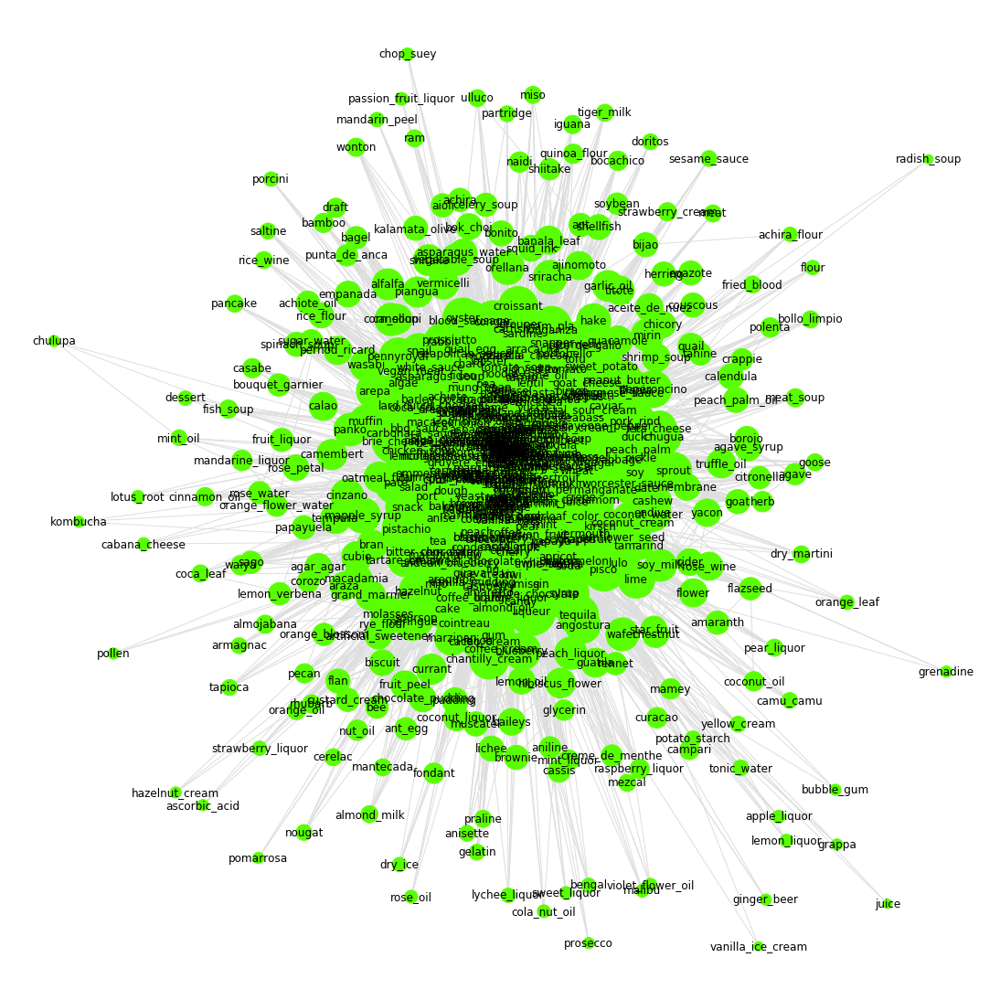

In [54]:
#projection into ingredient nodes
G = bipartite.weighted_projected_graph(B,nodesingredients)
#get the node degrees
d = dict(G.degree)


#export to Gefx
nx.write_gexf(G,"/Users/juan/Dropbox/ACADEMICO/NYU PHD/Dissertation/paper3carrusel/all_nodes_with_attr.gexf")


plt.figure(figsize=(15,15))

#pos = nx.spectral_layout(G)
pos = nx.spring_layout(G)
#pos = nx.shell_layout(G)
#pos = nx.kamada_kawai_layout(G)
#pos = nx.planar_layout(G)

nx.draw(G, pos = pos, 
        nodelist=d.keys(), 
        with_labels=True, 
        edge_color = '#DEDEDF', 
        node_color='#5AFE03',
        node_size=[v * 50 for v in d.values()])

#plt.savefig("bipartitenetwork.svg")
plt.show()

#delete the # below if you want to save the plot
#files.download("bipartitenetwork.svg") 

#print(nx.degree_histogram(G))

##### Ok, can we obtain better results if we extract the backbone of the network?

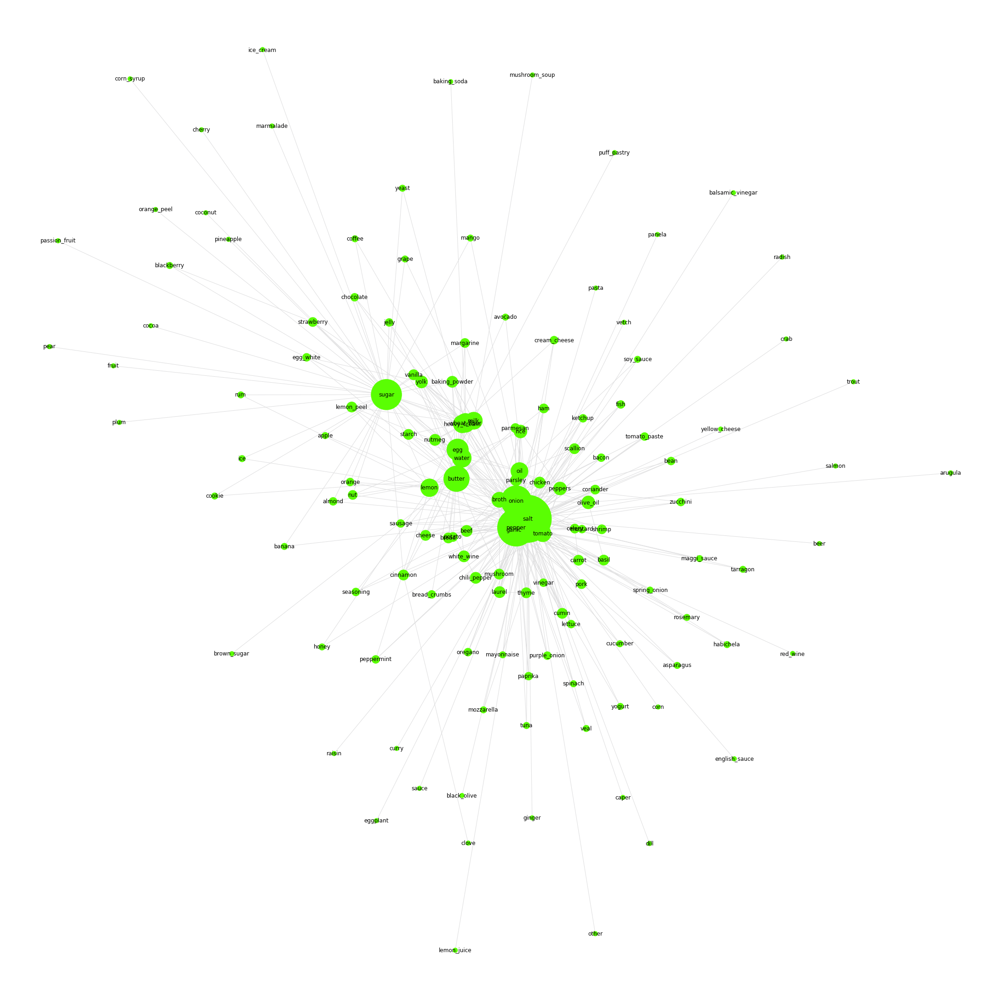

In [55]:

#The alpha parameter determines how much of the network is pruned. The lower the number the more pruning it does. Based on function defined above
nx.set_node_attributes(G, ingredient_category, 'category')
backbonell2 = nf.extract_backbone(G,0.0002)


##projection into ingredient nodes
#get the node degrees
d = dict(backbonell2.degree)

plt.figure(figsize=(30,30))

posBackBone = nx.spring_layout(backbonell2)


nx.draw(backbonell2, posBackBone, 
        nodelist=d.keys(), 
        with_labels=True, 
        edge_color = '#DEDEDF', 
        node_color='#5AFE03',
        node_size=[v * 100 for v in d.values()])

plt.show()

##### Ok, we can export this network to Gephy to obtain a better visualization

## 4. Describe/Characterize the Network

#### Now, let's see which nodes and edges are the most important



## 6. Dynamic


### Missing Data Analysis

In [56]:
carrusel_df.head(5)

,date,month,day,year,recipe_name,ingredient_en,category,key_node
0,3/18/77,3,18,1977,ensalada_rusa_3181977,potato,vegetable,0
1,3/18/77,3,18,1977,ensalada_rusa_3181977,apple,fruit,0
2,3/18/77,3,18,1977,ensalada_rusa_3181977,carrot,vegetable,0
3,3/18/77,3,18,1977,ensalada_rusa_3181977,vetch,plant,0
4,3/18/77,3,18,1977,ensalada_rusa_3181977,mayonnaise,plant derivative,0


In [57]:
temp = carrusel_df
temp['key_node'] = 1
print(temp.shape)


#table = pd.pivot_table(temp, values='key_node', index=['year'], columns=['ingredient_en'], aggfunc=np.sum)
table_month = pd.pivot_table(temp, values='key_node', index=['ingredient_en'], columns=['month'], aggfunc=np.sum)
print(table_month.shape)
table_month['Total']= table_month.sum(axis=1)
table_month = table_month.sort_values(by=['Total'], ascending=False)
table_month = table_month.drop(['Total'], axis=1)
table_month

#table = pd.pivot_table(temp, values='key_node', index=['year'], columns=['ingredient_en'], aggfunc=np.sum)
table_year = pd.pivot_table(temp, values='key_node', index=['ingredient_en'], columns=['year'], aggfunc=np.sum)
print(table_year.shape)
table_year['Total']= table_year.sum(axis=1)
table_year = table_year.sort_values(by=['Total'], ascending=False)
table_year = table_year.drop(['Total'], axis=1)
table_year

(49430, 8)
(559, 12)
(559, 41)


year,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,...,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
ingredient_en,,,,,,,,,,,,,,,,,,,,,
salt,22.0,18.0,56.0,93.0,83.0,101.0,100.0,110.0,143.0,111.0,...,79.0,45.0,50.0,57.0,52.0,46.0,52.0,56.0,47.0,27.0
pepper,16.0,14.0,23.0,63.0,64.0,57.0,69.0,76.0,89.0,70.0,...,65.0,28.0,43.0,38.0,19.0,37.0,39.0,49.0,26.0,19.0
butter,3.0,8.0,53.0,58.0,52.0,72.0,57.0,60.0,90.0,77.0,...,26.0,19.0,19.0,24.0,23.0,20.0,20.0,22.0,26.0,8.0
sugar,5.0,3.0,32.0,36.0,39.0,70.0,38.0,82.0,96.0,84.0,...,32.0,21.0,27.0,32.0,42.0,36.0,24.0,15.0,26.0,15.0
onion,14.0,16.0,30.0,52.0,46.0,33.0,54.0,47.0,68.0,60.0,...,53.0,19.0,25.0,19.0,16.0,16.0,23.0,23.0,8.0,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
orange_oil,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN
empanada,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN
dry_martini,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


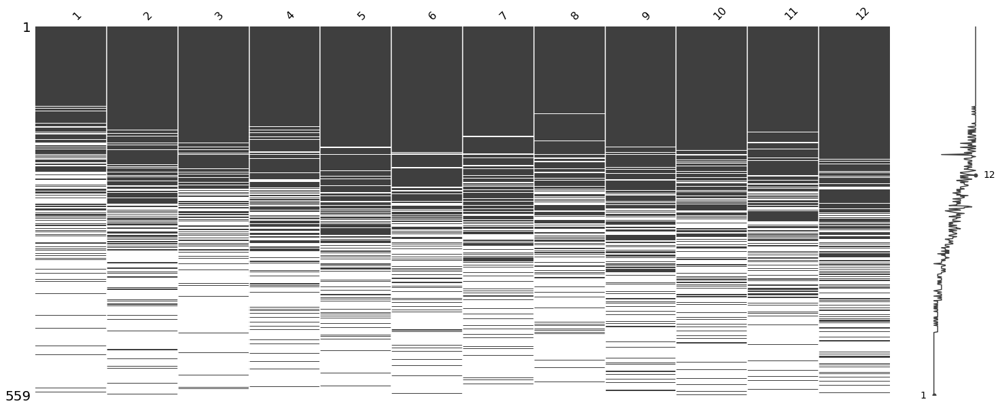

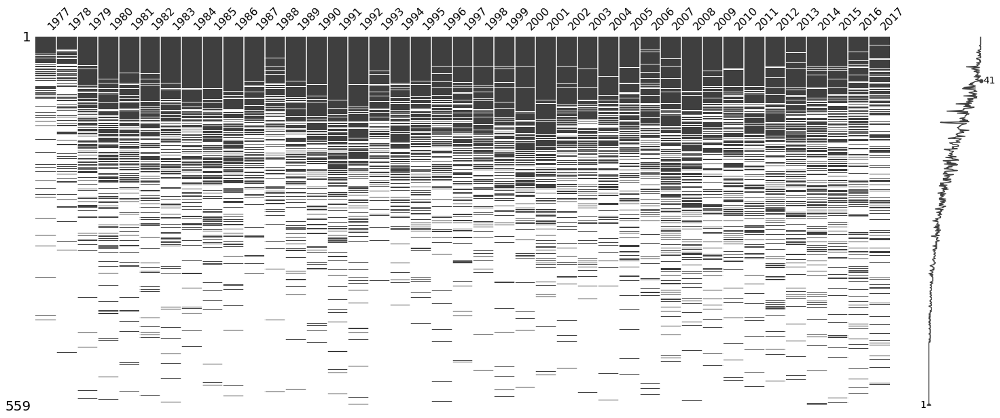

In [58]:
#!pip install missingno
>>> import missingno as msno
>>> %matplotlib inline
>>> msno.matrix(table_month)
>>> msno.matrix(table_year)

### Heatmaps

In [59]:
table_month.index[0:10]

Index(['salt', 'pepper', 'butter', 'sugar', 'onion', 'egg', 'water', 'garlic',
       'oil', 'heavy_cream'],
      dtype='object', name='ingredient_en')

In [60]:
#select only the 20th ingredient for visualization purposes


#select only the 20th ingredient for visualization purposes

select_ingredients=[]
for i in range(0,len(table_month.index)):
    if i%20 == 0:
        select_ingredients.append(table_month.index[i])
    if i%20 != 0:
        select_ingredients.append('NaN')

        
select_ingredients = np.array(select_ingredients)        
#select_ingredients

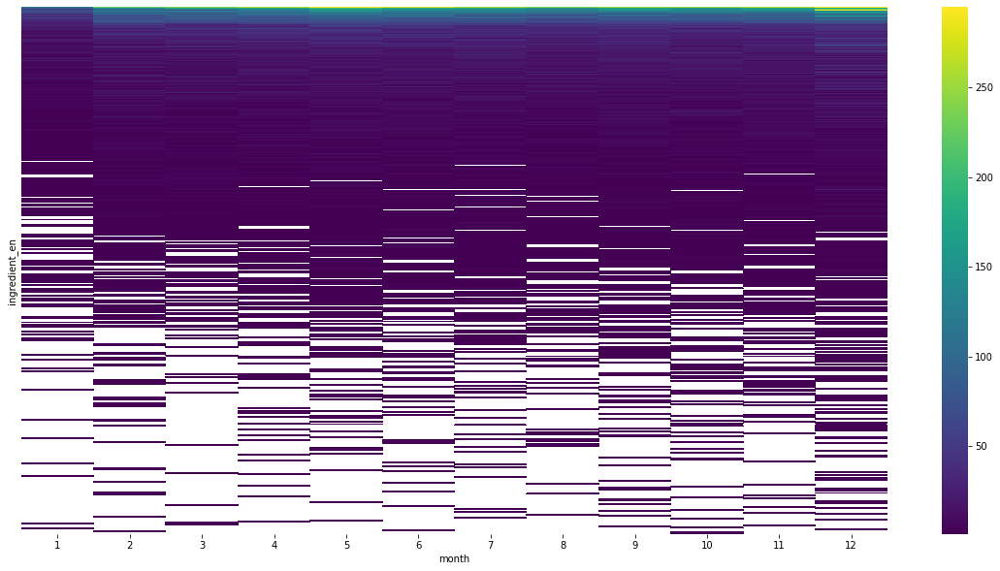

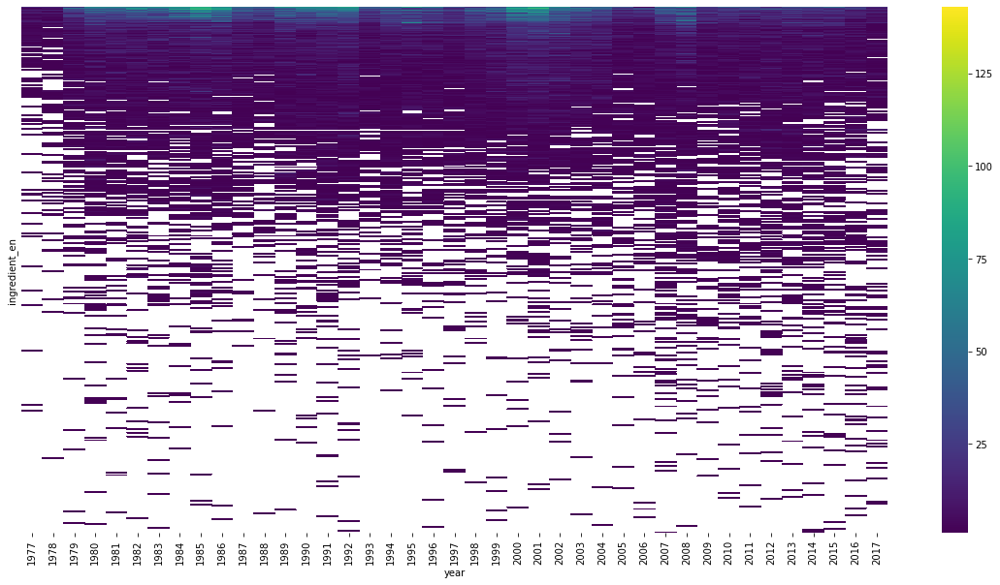

In [61]:
#table_month['select_ingredient'] = select_ingredients

plt.figure(figsize=(20,10))
heat_map = sns.heatmap(table_month, xticklabels=True, yticklabels=False, cmap='viridis')

plt.figure(figsize=(20,10))
heat_map = sns.heatmap(table_year, xticklabels=True, yticklabels=False, cmap='viridis')

In [62]:
#IDI: Ingredient Discovery Index 

idi = []

for x in range(1977, 2018):
  
  temp_df = carrusel_df.loc[(carrusel_df['year'] <= x)]
  
  nodesrecipes_temp = list(temp_df.recipe_name.unique())
  nodesingredients_temp = list(temp_df.ingredient_en.unique())
  edgesrecipeingredient_temp = list(zip(temp_df.recipe_name, temp_df.ingredient_en))
  
  #create Temporal Bipartite Network
  #here we are creating an empty graph (network)
  B_temp = nx.Graph()

  #we are adding the nodes, which we loaded on the previous step. 
  #note how we add the bipartite nodes below
  B_temp.add_nodes_from(nodesrecipes_temp, bipartite=0)
  B_temp.add_nodes_from(nodesingredients_temp, bipartite=1)
  
  #add edges
  B_temp.add_edges_from(edgesrecipeingredient_temp)
  
  #we want these statistics on the output
  

  idi.append(
            {
                'year': x,
                'num_recipes': len(nodesrecipes_temp),
                'num_ingredients': len(nodesingredients_temp),
            }
        )

idi = pd.DataFrame(idi)
idi['Ingredient Percentage'] = idi['num_ingredients'] / 559
idi['Recipe Percentage'] = idi['num_recipes'] / 5981
idi.head()

,year,num_recipes,num_ingredients,Ingredient Percentage,Recipe Percentage
0,1977,23,85,0.152057,0.003846
1,1978,47,126,0.225403,0.007858
2,1979,153,207,0.370304,0.025581
3,1980,329,263,0.470483,0.055008
4,1981,477,284,0.508050,0.079753


Text(0.5, 1.0, 'Number of Ingredients and Number of Recipes')

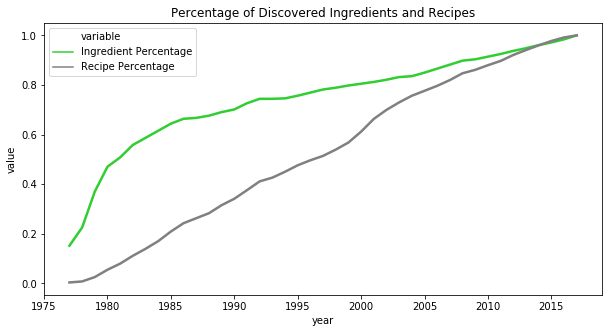

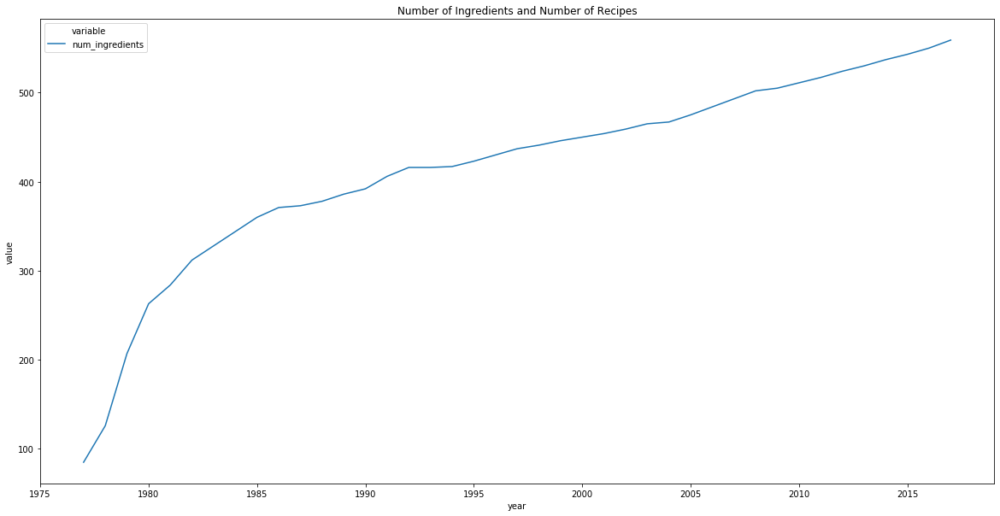

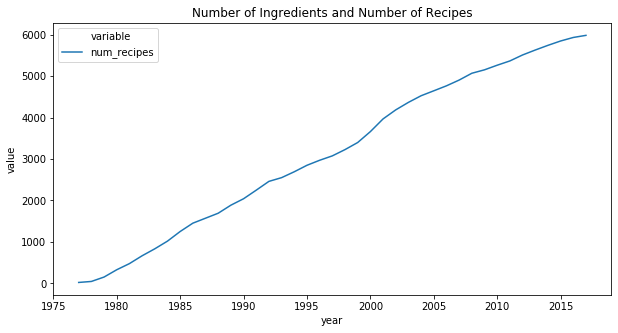

In [63]:
#IDI
idi_i = idi[['year','Ingredient Percentage','Recipe Percentage']]

import seaborn as sns

plt.figure(figsize=(10,5))
sns.lineplot(x='year', y='value', hue='variable', palette=("limegreen","grey"), linewidth=2.5,
             data=pd.melt(idi_i, ['year'])).set_title("Percentage of Discovered Ingredients and Recipes")

#Number Ingredients
idi_num_recipes = idi[['year','num_ingredients']]

import seaborn as sns

plt.figure(figsize=(20,10))
sns.lineplot(x='year', y='value', hue='variable',
             data=pd.melt(idi_num_recipes, ['year'])).set_title('Number of Ingredients and Number of Recipes')

#Number Recipes
idi_num_ingred = idi[['year','num_recipes']]

import seaborn as sns

plt.figure(figsize=(10,5))
sns.lineplot(x='year', y='value', hue='variable',
             data=pd.melt(idi_num_ingred, ['year'])).set_title('Number of Ingredients and Number of Recipes')



In [64]:
#load NODE data as lists. The symbols such as (' , etc were concatenated on 
list_of_graphs = []
for x in range(1982, 2018, 5):
  
  temp_df = carrusel_df.loc[(carrusel_df['year'] <= x)]
  
  nodesrecipes_temp = list(temp_df.recipe_name.unique())
  nodesingredients_temp = list(temp_df.ingredient_en.unique())
  edgesrecipeingredient_temp = list(zip(temp_df.recipe_name, temp_df.ingredient_en))
  
  #create Temporal Bipartite Network
  #here we are creating an empty graph (network)
  B_temp = nx.Graph()

  #we are adding the nodes, which we loaded on the previous step. 
  #note how we add the bipartite nodes below
  B_temp.add_nodes_from(nodesrecipes_temp, bipartite=0)
  B_temp.add_nodes_from(nodesingredients_temp, bipartite=1)
  
  #add edges
  B_temp.add_edges_from(edgesrecipeingredient_temp)
  
  #we want these statistics on the output
  print("Number of Recipes", x,": ", len(nodesrecipes_temp))
  print("Number of Ingredients",": ", x ,len(nodesingredients_temp))
  
    
  G_temp = bipartite.weighted_projected_graph(B_temp,nodesingredients_temp)
  nx.set_node_attributes(G_temp, ingredient_category, 'category')
    
  #Project
  globals()['backbone_temp%s' % x] = nf.extract_backbone(G_temp,0.000001)
  list_of_graphs.append(globals()['backbone_temp%s' % x])

  #Export to Gephy
  temp_for_geph = nf.extract_backbone(G_temp,0.000001)
  nx.write_gexf(temp_for_geph,"/Users/juan/Dropbox/ACADEMICO/NYU PHD/Dissertation/paper3carrusel/backbone"+str(x)+".gexf")
 

Number of Recipes 1982 :  666
Number of Ingredients :  1982 312
Number of Recipes 1987 :  1572
Number of Ingredients :  1987 373
Number of Recipes 1992 :  2460
Number of Ingredients :  1992 416
Number of Recipes 1997 :  3075
Number of Ingredients :  1997 437
Number of Recipes 2002 :  4184
Number of Ingredients :  2002 459
Number of Recipes 2007 :  4903
Number of Ingredients :  2007 493
Number of Recipes 2012 :  5508
Number of Ingredients :  2012 524
Number of Recipes 2017 :  5981
Number of Ingredients :  2017 559


In [65]:
list_of_graphs[0]

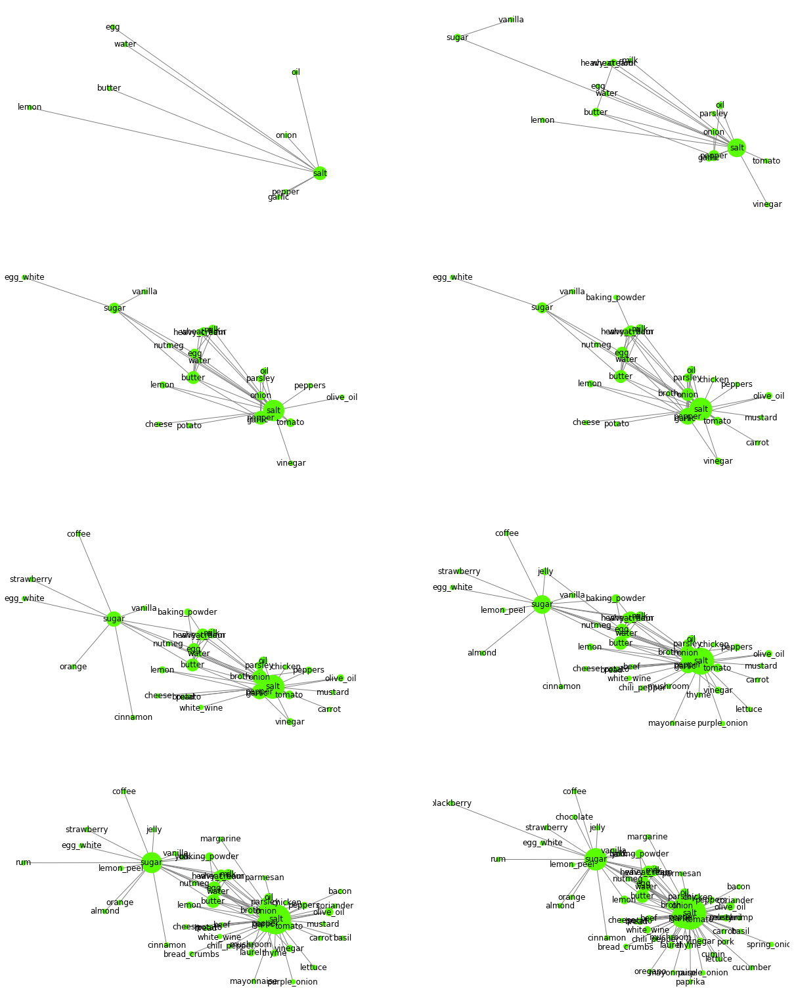

In [66]:
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(8.5*2.52,11*2.52)) #Letter paper size 8.5*2.52,11*2.52

for i in range(0,8): 
    d = dict(list_of_graphs[i].degree)
    pos_temp = nx.spring_layout(list_of_graphs[i])
    d_temp = dict(list_of_graphs[i].degree)
    
    
    ax = axes.flatten()
    nx.draw(list_of_graphs[i], 
                  nodelist=d.keys(), 
                  pos = posBackBone, 
                  with_labels=True, 
                  edge_color = 'grey', 
                  node_color='#5AFE03',
                  node_size=[v * 50 for v in d_temp.values()],ax=ax[i])
    ax[i].set_axis_off()

plt.savefig("dynamic_labels.jpg")
plt.show()


**Sugar, Degree**

In [67]:
print(len(list_of_graphs[1].degree))

17


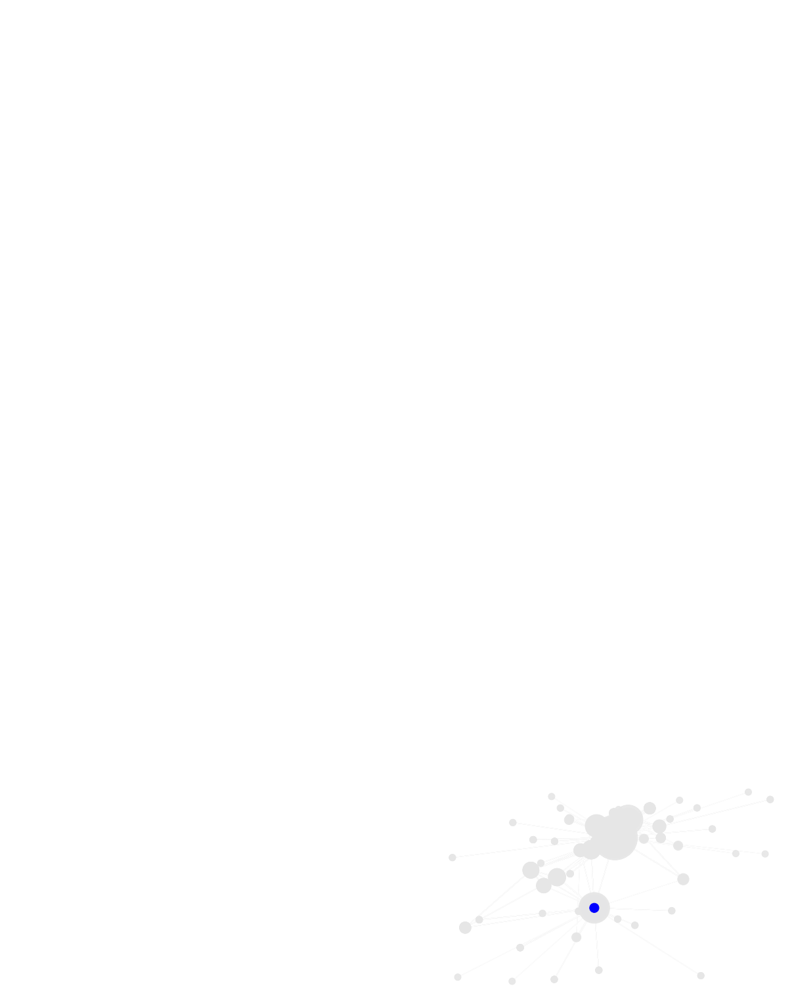

In [68]:
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(8.5*2.52,11*2.52)) #Letter paper size

for i in range(0,8): 
    d = dict(list_of_graphs[i].degree)
    pos_temp = nx.spring_layout(list_of_graphs[i])
    d_temp = dict(list_of_graphs[i].degree)
    pos_temp = pos
    
    ax = axes.flatten()
    
    nx.draw(list_of_graphs[i], pos = pos, 
        nodelist=d.keys(), 
        with_labels=False, 
        edge_color = '#FFFFFF', 
        node_color='#FFFFFF',
        node_size=0.0000000000000000000000000000000000000000000000000000000000001)
    ax[i].set_axis_off()
  
    nx.draw(list_of_graphs[i], 
          nodelist=d_temp.keys(), pos = pos, 
          with_labels=False, 
          edge_color = '#e6e6e6', 
          node_color='#e6e6e6',
          node_size=[v * 100 for v in d_temp.values()],
          alpha=0.9)
    ax[i].set_axis_off()
  
    nx.draw(list_of_graphs[i], 
          nodelist=["sugar"], pos = pos, 
          with_labels=False, 
          edge_color = '#FFFFFF', 
          node_color='b',
          node_size=[v * 100 for v in d_temp.values()])
    ax[i].set_axis_off()
    
plt.show()

Number of Recipes 1982 :  666
Number of Ingredients :  1982 312


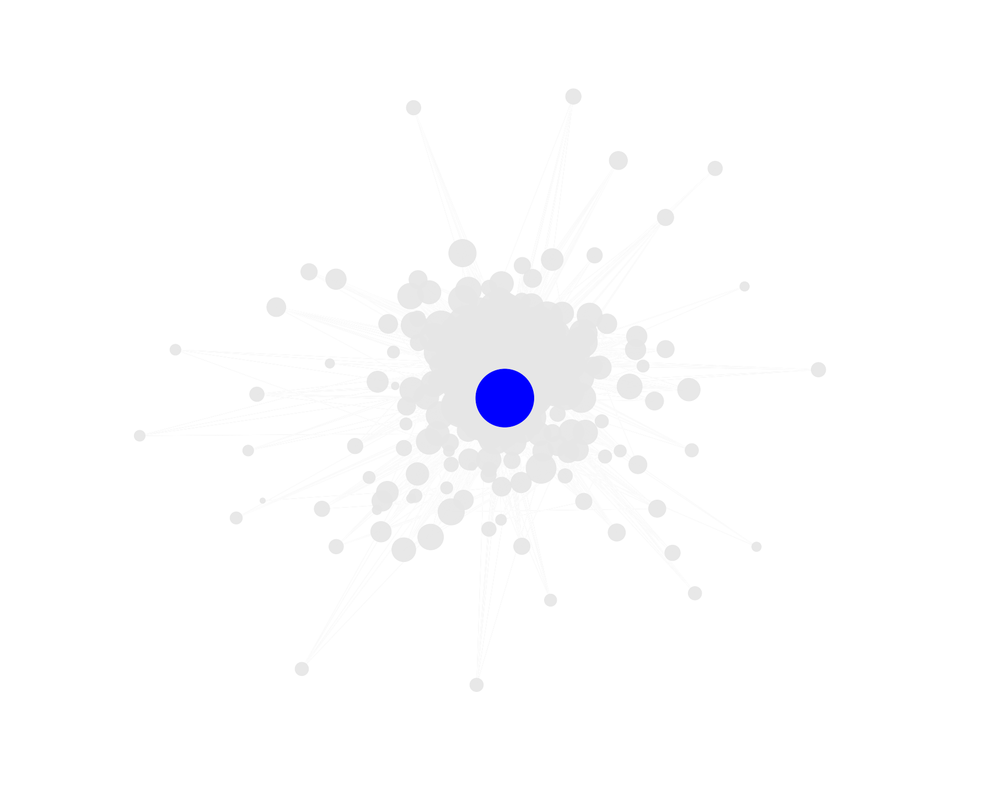

Number of Recipes 1987 :  1572
Number of Ingredients :  1987 373


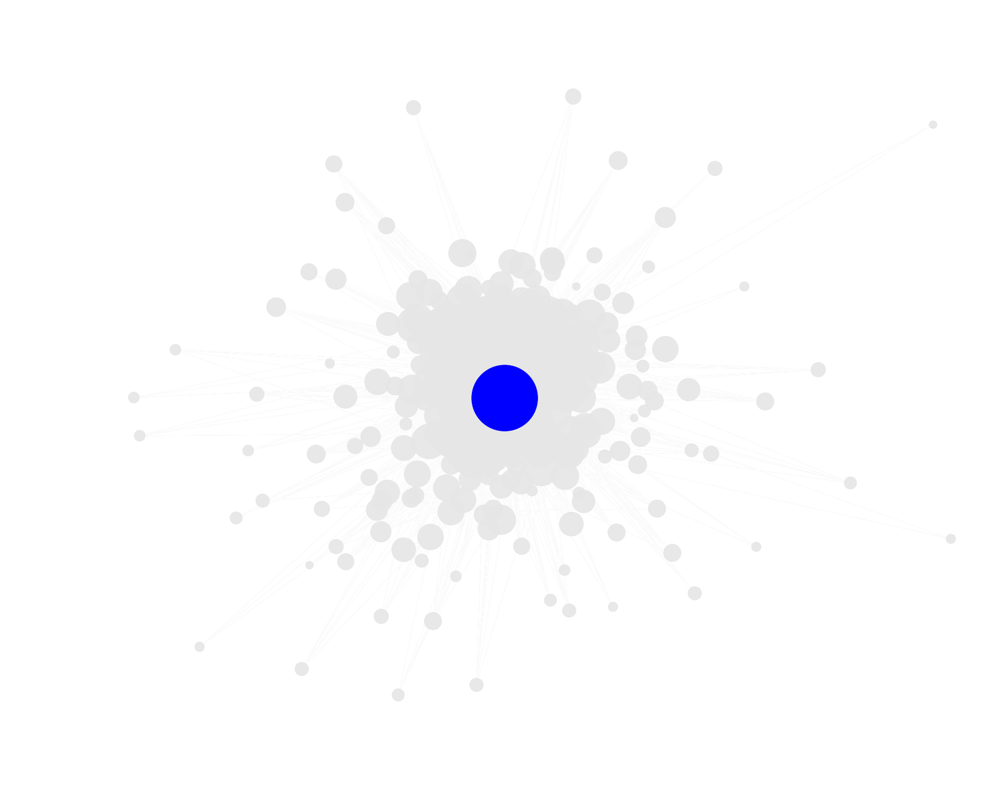

Number of Recipes 1992 :  2460
Number of Ingredients :  1992 416


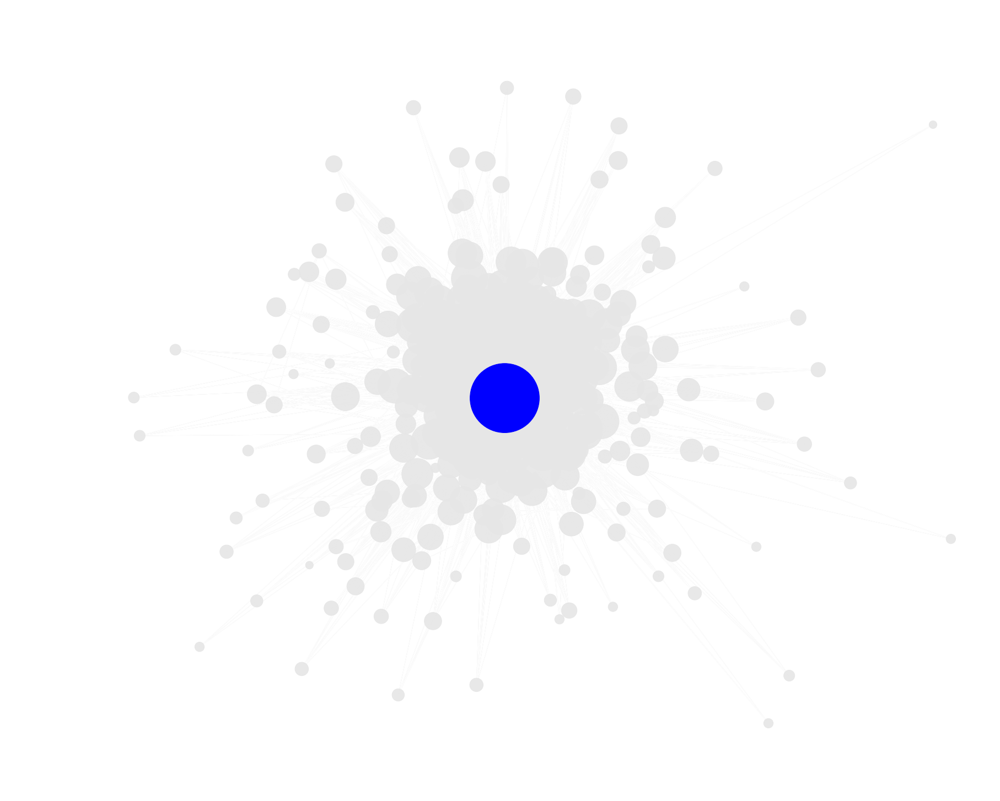

Number of Recipes 1997 :  3075
Number of Ingredients :  1997 437


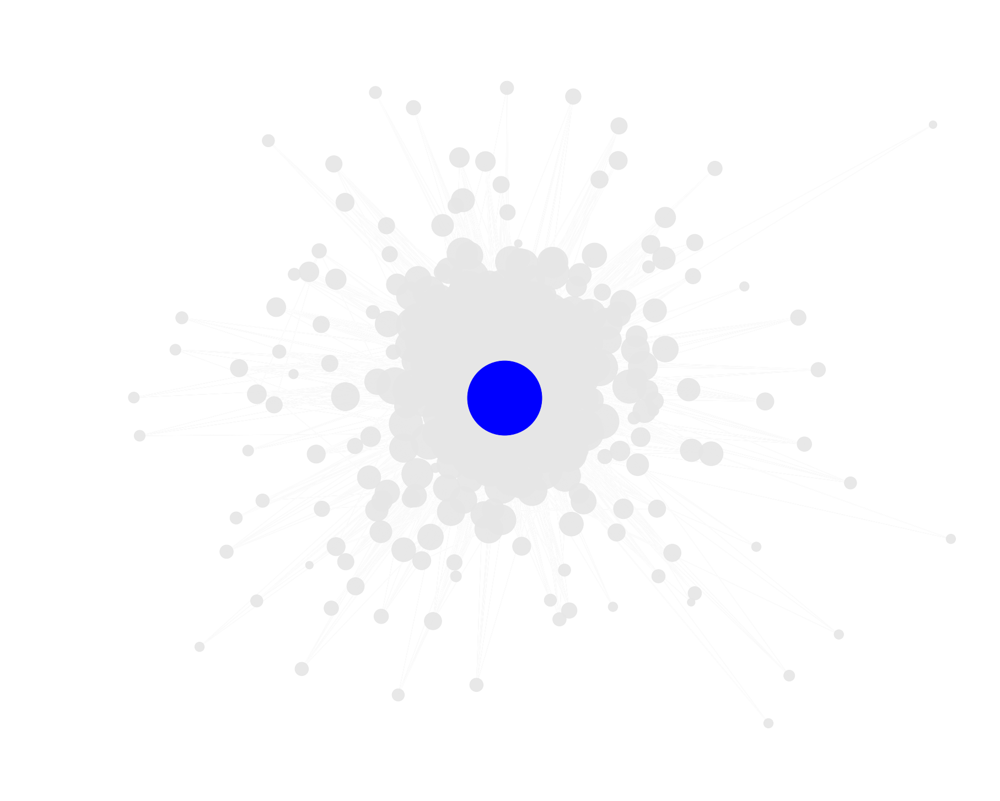

Number of Recipes 2002 :  4184
Number of Ingredients :  2002 459


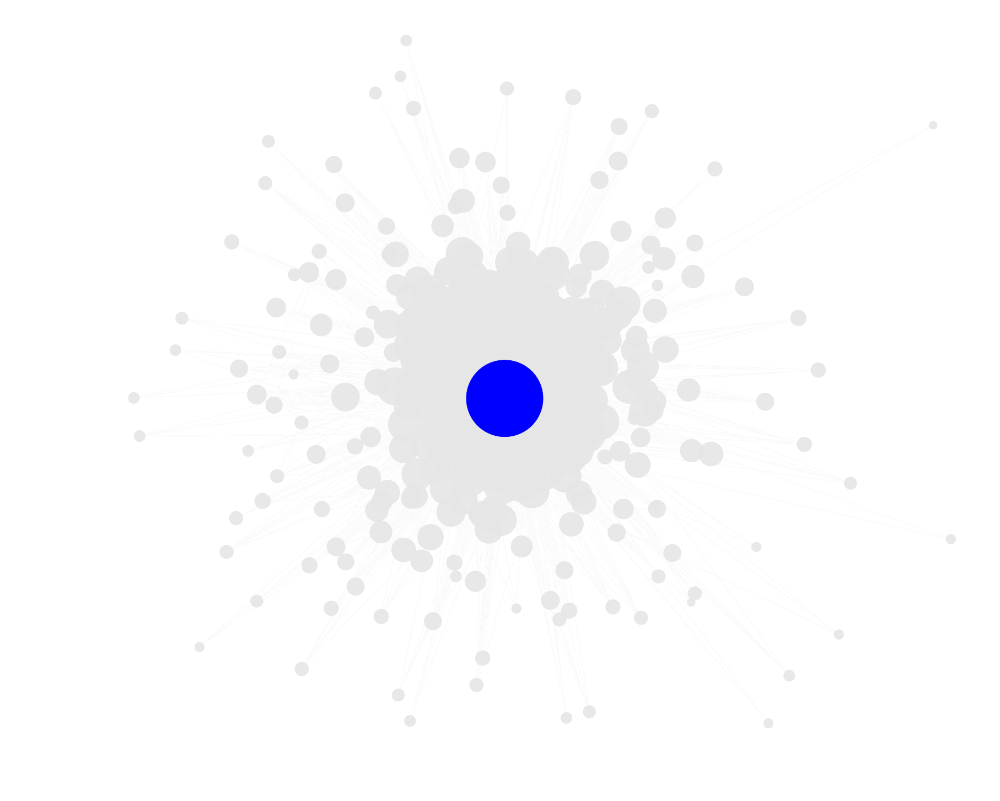

Number of Recipes 2007 :  4903
Number of Ingredients :  2007 493


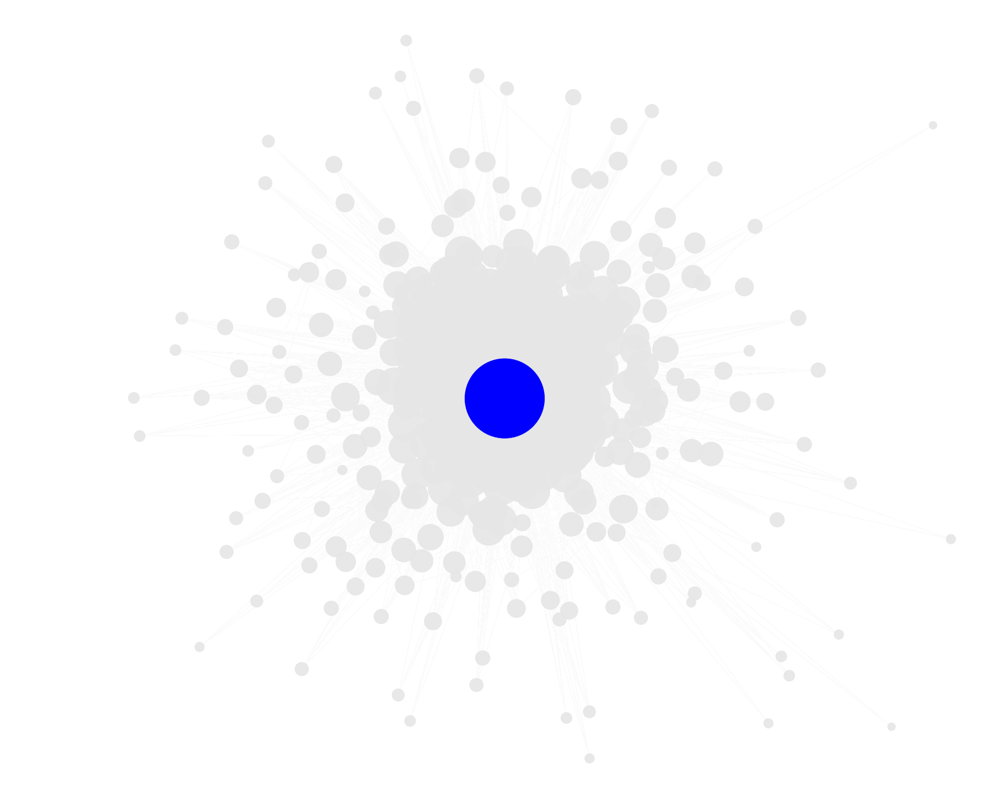

Number of Recipes 2012 :  5508
Number of Ingredients :  2012 524


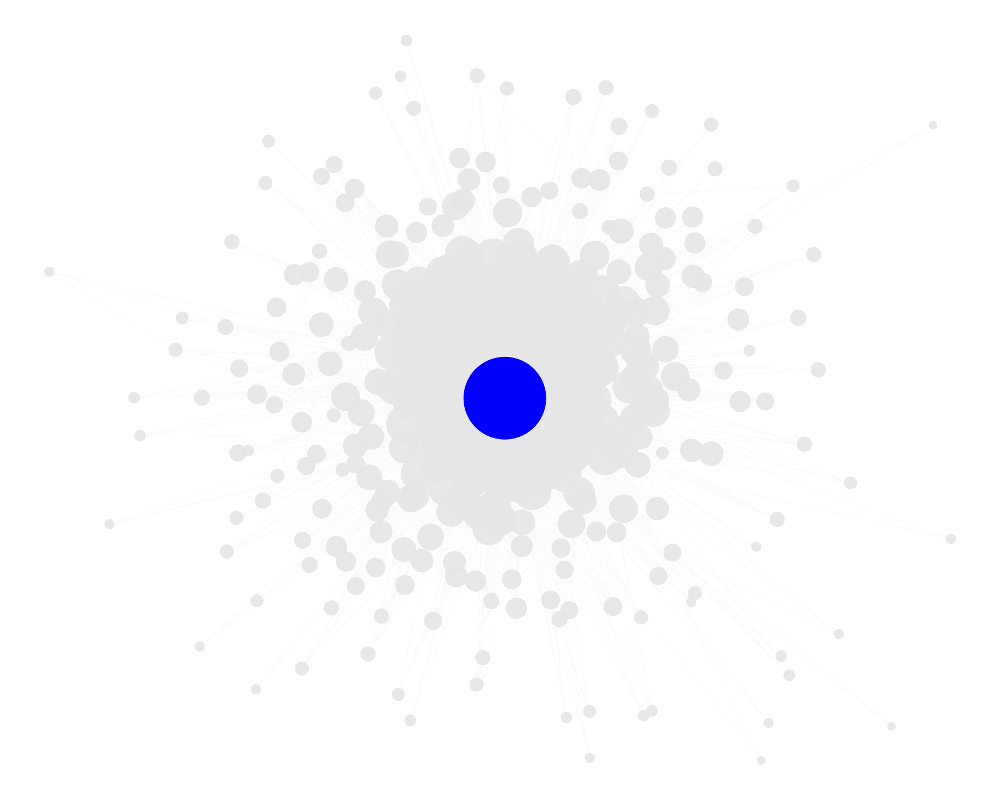

Number of Recipes 2017 :  5981
Number of Ingredients :  2017 559


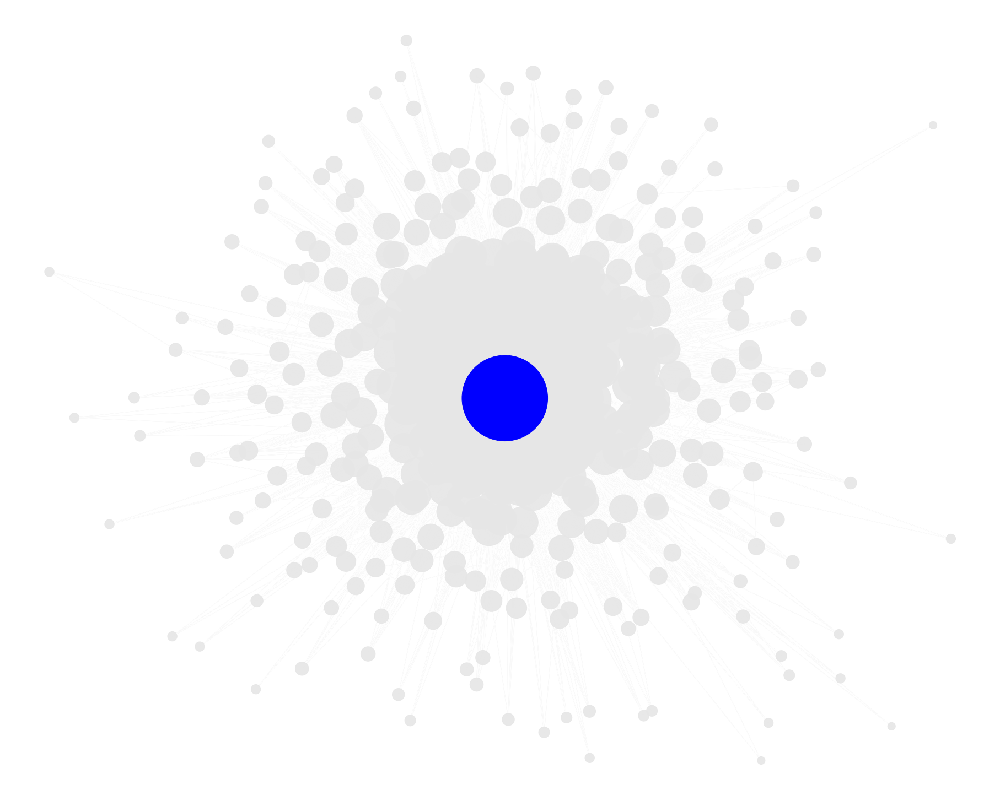

In [69]:
#load NODE data as lists. The symbols such as (' , etc were concatenated on 

for x in range(1982, 2018, 5):
  
  temp_df = carrusel_df.loc[(carrusel_df['year'] <= x)]
  
  nodesrecipes_temp = list(temp_df.recipe_name.unique())
  nodesingredients_temp = list(temp_df.ingredient_en.unique())
  edgesrecipeingredient_temp = list(zip(temp_df.recipe_name, temp_df.ingredient_en))
  
  
  #create Temporal Bipartite Network
  #here we are creating an empty graph (network)
  B_temp = nx.Graph()

  #we are adding the nodes, which we loaded on the previous step. 
  #note how we add the bipartite nodes below
  B_temp.add_nodes_from(nodesrecipes_temp, bipartite=0)
  B_temp.add_nodes_from(nodesingredients_temp, bipartite=1)
  
  #add edges
  B_temp.add_edges_from(edgesrecipeingredient_temp)
  
  #we want these statistics on the output
  print("Number of Recipes", x,": ", len(nodesrecipes_temp))
  print("Number of Ingredients",": ", x ,len(nodesingredients_temp))
  

  G_temp = bipartite.weighted_projected_graph(B_temp,nodesingredients_temp)
  #get the node degrees
  d_temp = dict(G_temp.degree)

  plt.figure(figsize=(25,20))

  #THIS IS IMPORTANT. THE POSITIONS ARE FROM THE AGGREGATED NETWORK AS I DONT WANT THE NODES TO JUMP AROUND
  pos_temp = pos
  
  #coloring white. To retain positions
  nx.draw(G, pos = pos, 
        nodelist=d.keys(), 
        with_labels=False, 
        edge_color = '#FFFFFF', 
        node_color='#FFFFFF',
        node_size=0.0000000000000000000000000000000000000000000000000000000000001)
  
  nx.draw(G_temp, 
          nodelist=d_temp.keys(), pos = pos, 
          with_labels=False, 
          edge_color = '#e6e6e6', 
          node_color='#e6e6e6',
          node_size=[v * 100 for v in d_temp.values()],
          alpha=0.9)
  
  nx.draw(G_temp, 
          nodelist=["sugar"], pos = pos, 
          with_labels=False, 
          edge_color = '#FFFFFF', 
          node_color='b',
          node_size=[v * 100 for v in d_temp.values()])
  plt.show()
  #plt.savefig("tempnetsugar.jpg")

  #saving the plot to the local machine
  #files.download("tempnetsugar.jpg") 
  
  plt.close("tempnetsugar.jpg")

**Sugar pagerank**

Number of Recipes 1982 :  666
Number of Ingredients :  1982 312
Number of Recipes 1987 :  1572
Number of Ingredients :  1987 373
Number of Recipes 1992 :  2460
Number of Ingredients :  1992 416
Number of Recipes 1997 :  3075
Number of Ingredients :  1997 437
Number of Recipes 2002 :  4184
Number of Ingredients :  2002 459
Number of Recipes 2007 :  4903
Number of Ingredients :  2007 493
Number of Recipes 2012 :  5508
Number of Ingredients :  2012 524
Number of Recipes 2017 :  5981
Number of Ingredients :  2017 559


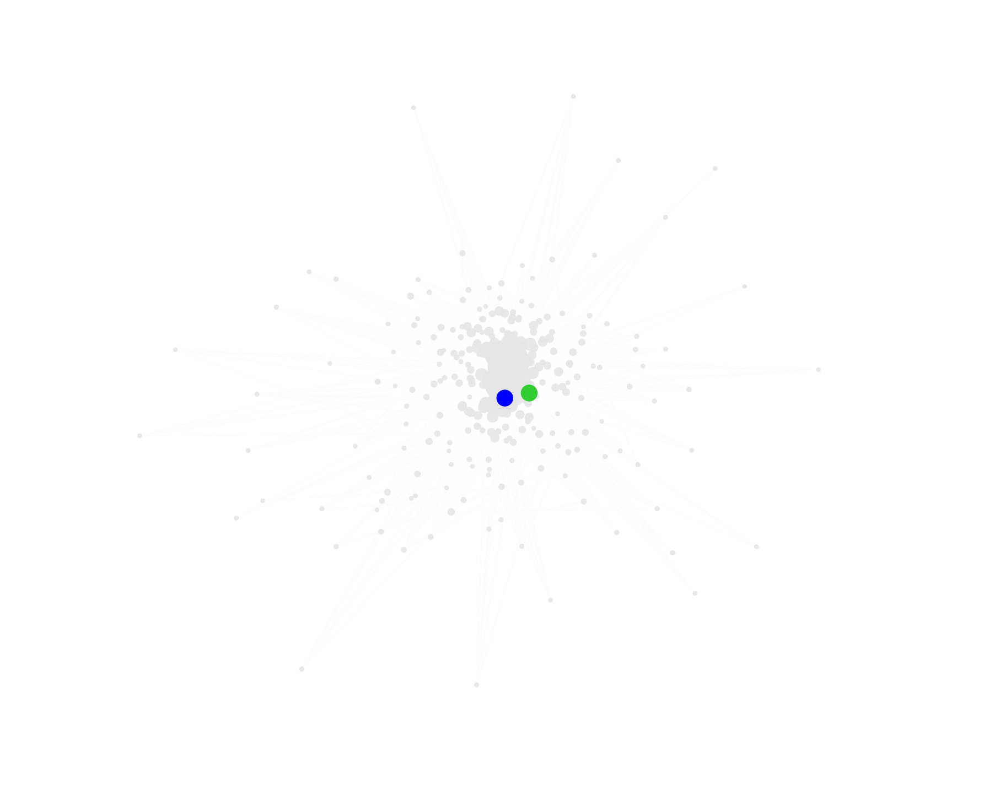

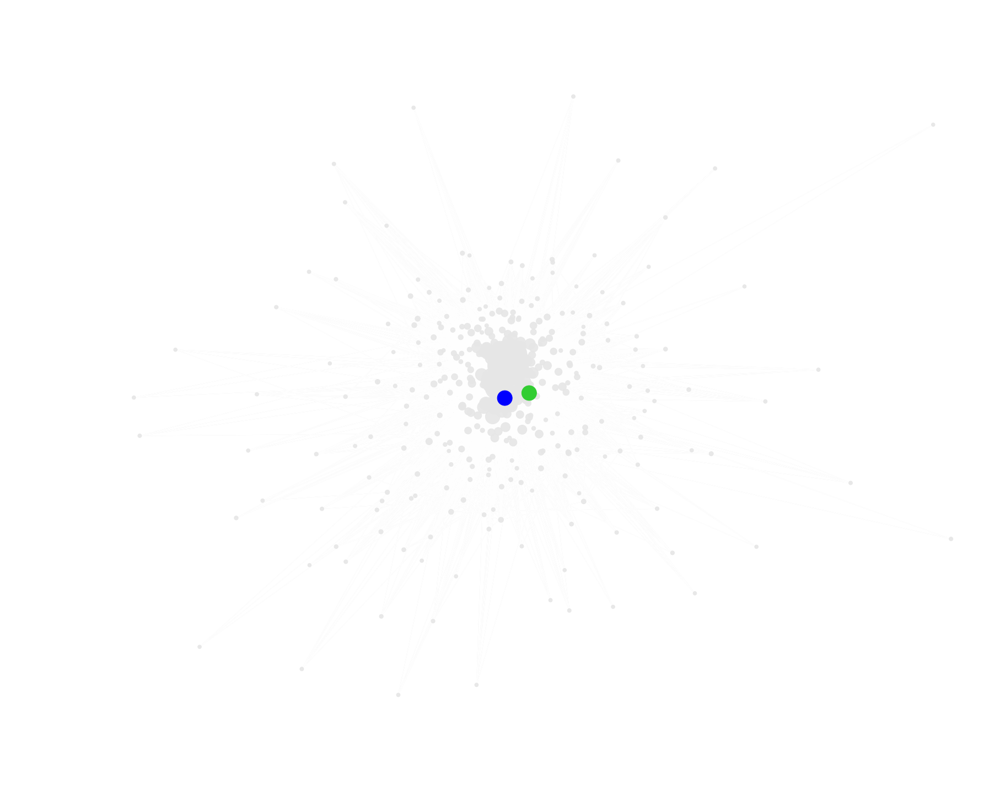

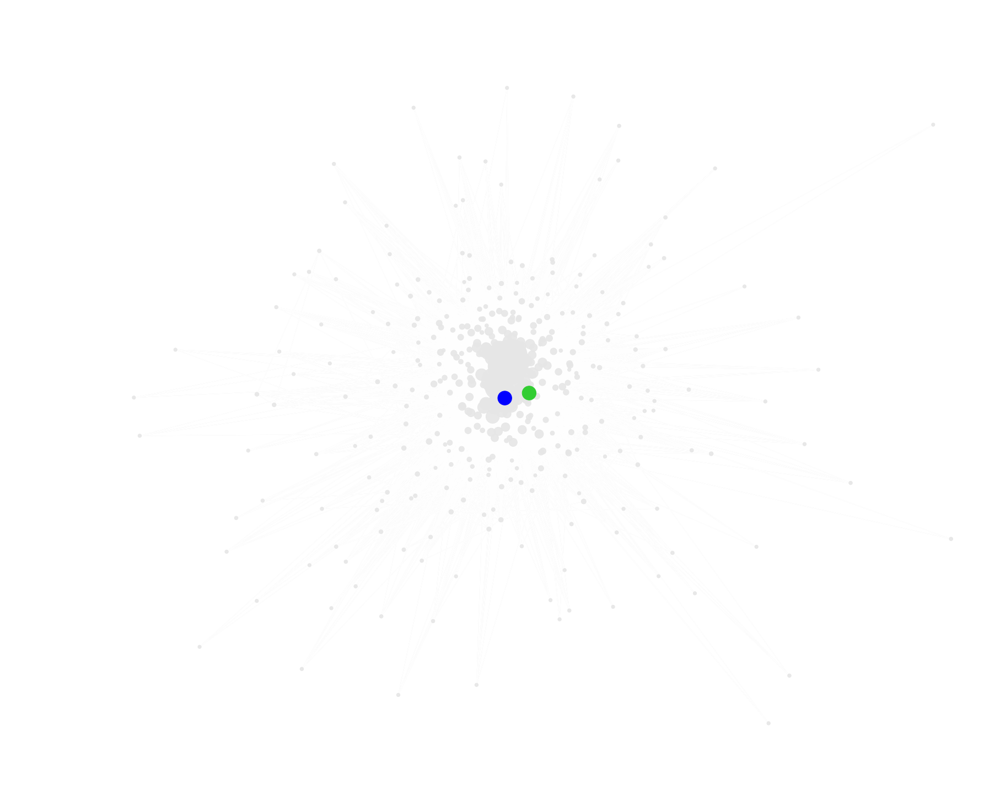

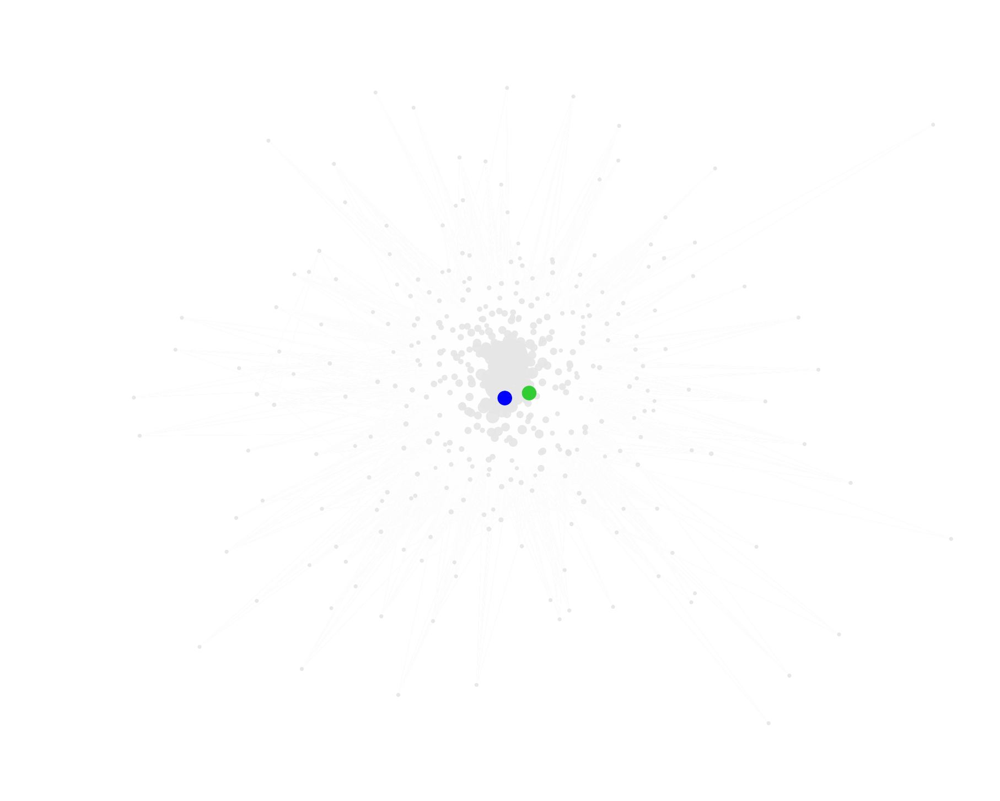

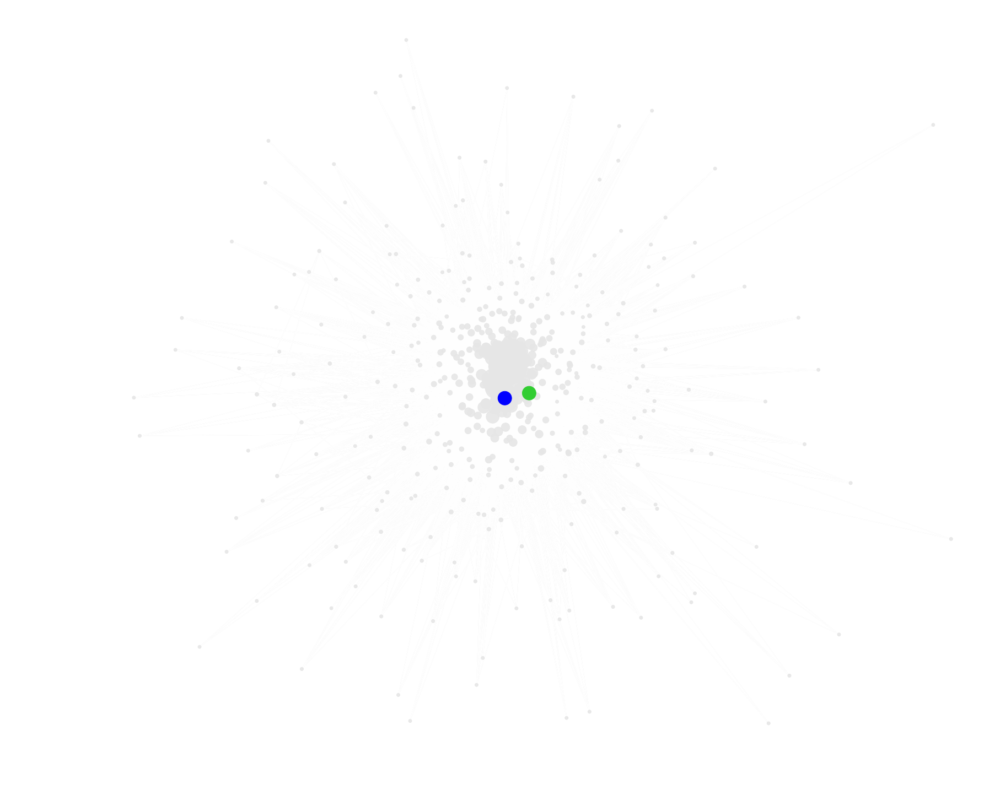

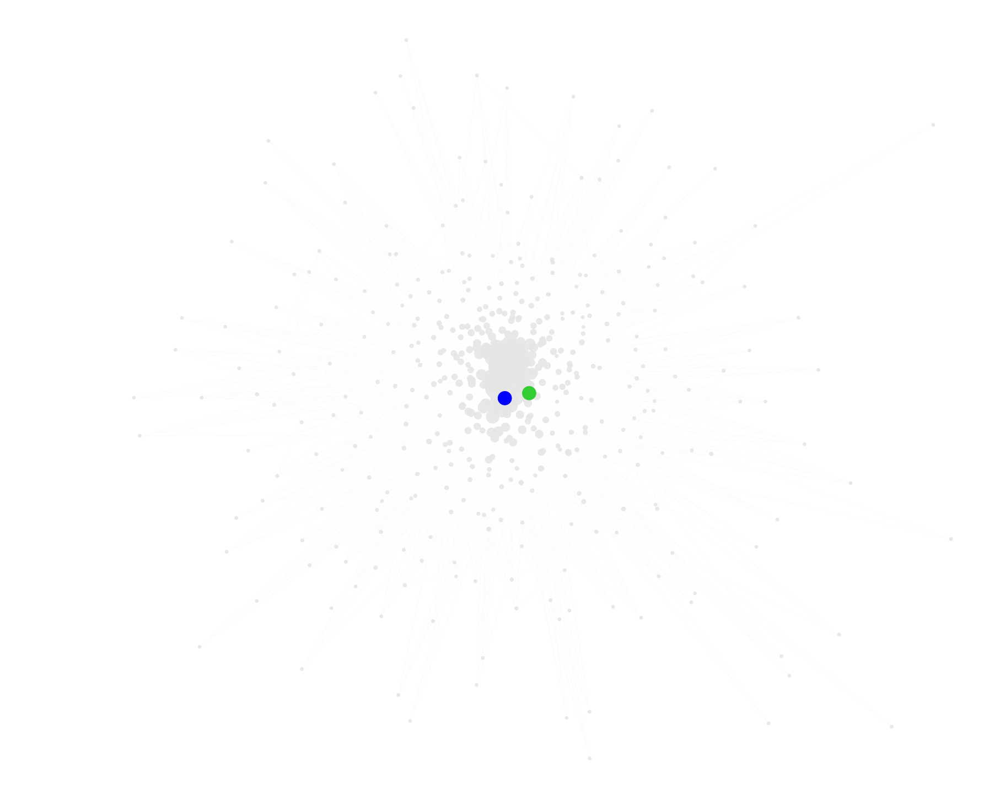

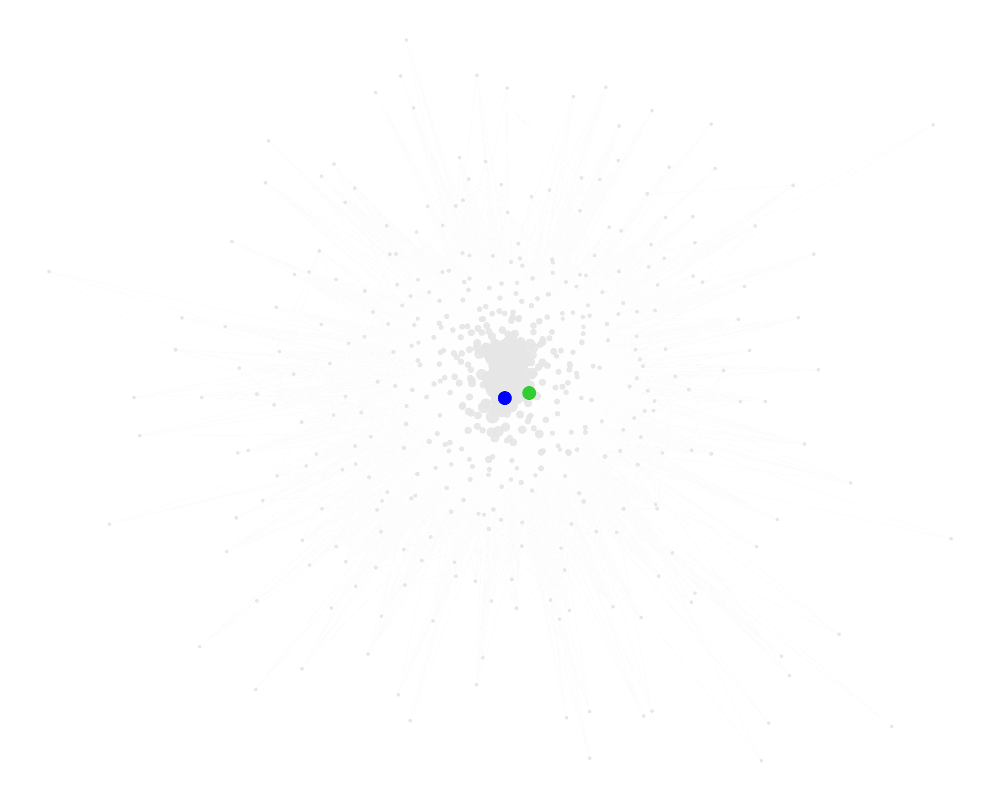

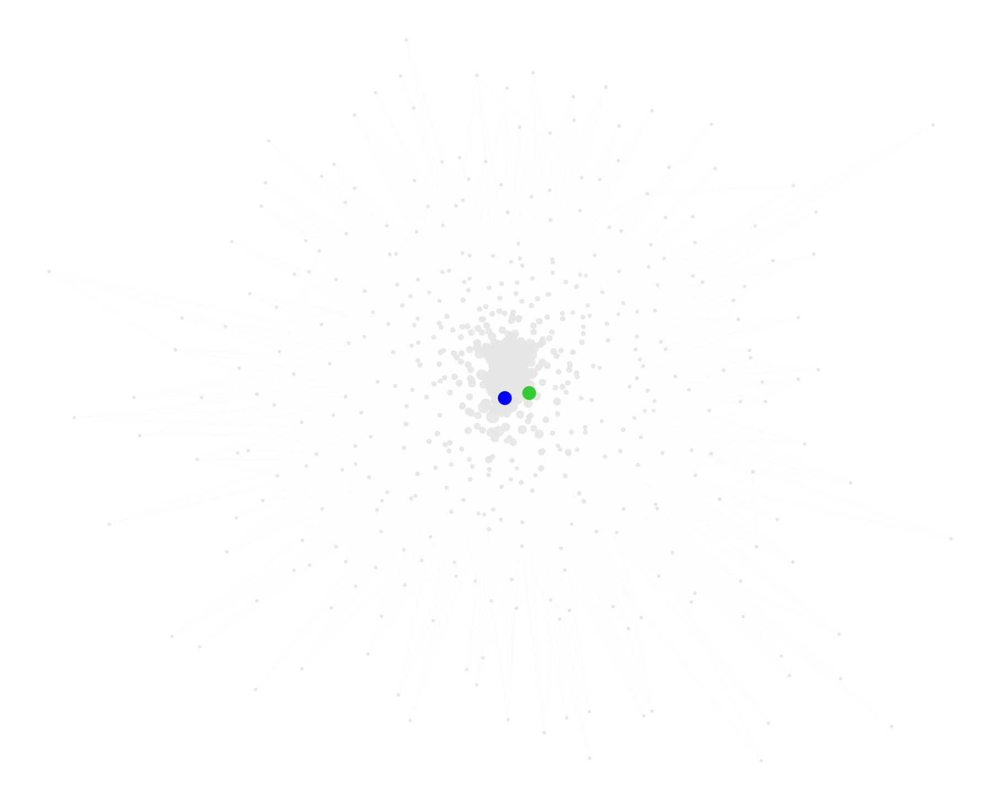

In [70]:
#load NODE data as lists. The symbols such as (' , etc were concatenated on 

for x in range(1982, 2018, 5):
  
  temp_df = carrusel_df.loc[(carrusel_df['year'] <= x)]
  
  nodesrecipes_temp = list(temp_df.recipe_name.unique())
  nodesingredients_temp = list(temp_df.ingredient_en.unique())
  edgesrecipeingredient_temp = list(zip(temp_df.recipe_name, temp_df.ingredient_en))
  
  
  #create Temporal Bipartite Network
  #here we are creating an empty graph (network)
  B_temp = nx.Graph()

  #we are adding the nodes, which we loaded on the previous step. 
  #note how we add the bipartite nodes below
  B_temp.add_nodes_from(nodesrecipes_temp, bipartite=0)
  B_temp.add_nodes_from(nodesingredients_temp, bipartite=1)
  
  #add edges
  B_temp.add_edges_from(edgesrecipeingredient_temp)
  
  #we want these statistics on the output
  print("Number of Recipes", x,": ", len(nodesrecipes_temp))
  print("Number of Ingredients",": ", x ,len(nodesingredients_temp))
  

  G_temp = bipartite.weighted_projected_graph(B_temp,nodesingredients_temp)
  #get the node degrees
  pgr_temp = dict(nx.pagerank(G_temp))

  plt.figure(figsize=(25,20))

  #THIS IS IMPORTANT. THE POSITIONS ARE FROM THE AGGREGATED NETWORK AS I DONT WANT THE NODES TO JUMP AROUND
  pos_temp = pos
  
  #coloring white. To retain positions
  nx.draw(G, pos = pos, 
        nodelist=d.keys(), 
        with_labels=False, 
        edge_color = '#FFFFFF', 
        node_color='#FFFFFF',
        node_size=0.0000000000000000000000000000000000000000000000000000000000001)
  
  nx.draw(G_temp, 
          nodelist=pgr_temp.keys(), pos = pos, 
          with_labels=False, 
          edge_color = '#e6e6e6', 
          node_color='#e6e6e6',
          node_size=[v * 100000 for v in pgr_temp.values()],
          alpha=0.9)
  
  nx.draw(G_temp, 
          nodelist=["sugar"], pos = pos, 
          with_labels=False, 
          edge_color = '#FFFFFF', 
          node_color='b',
          node_size=[v * 100000 for v in pgr_temp.values()])

  nx.draw(G_temp, 
          nodelist=["honey"], pos = pos, 
          with_labels=False, 
          edge_color = '#FFFFFF', 
          node_color='limegreen',
          node_size=[v * 100000 for v in pgr_temp.values()])

  plt.savefig("tempnetsugar.jpg")

  #saving the plot to the local machine
  #files.download("tempnetsugar.jpg") 
  
  plt.close("tempnetsugar.jpg")


In [71]:
print((pgr_temp))
print((d_temp))
#print(max(d_temp))

{'potato': 0.005810417467274997, 'apple': 0.0038468105836027785, 'carrot': 0.009021981093288799, 'vetch': 0.003802275212110372, 'mayonnaise': 0.004606326442641453, 'salt': 0.04858836874166085, 'pepper': 0.035637583560799775, 'egg': 0.022190574389774884, 'puff_pastry': 0.0012813912265440043, 'salad': 0.0004763668440385255, 'anchovy': 0.0012441007095739852, 'parsley': 0.014443418933019134, 'fish': 0.002443033624719528, 'rice': 0.006460680812958235, 'pumpkin': 0.0008824770832155642, 'onion': 0.02808375267155247, 'garlic': 0.021390851106761574, 'peppers': 0.013708587915158688, 'butter': 0.027129823850124683, 'oil': 0.019288648202098815, 'heavy_cream': 0.017073360426857143, 'chicken': 0.010400613706869637, 'broccoli': 0.0014475665064024455, 'corn': 0.0035660168421745827, 'tomato': 0.016846082367004044, 'cabbage': 0.0016464280625105082, 'cumin': 0.003566576711061331, 'tuna': 0.0025355125135995225, 'celery': 0.008271321061998675, 'lemon': 0.01744321500998126, 'olive_oil': 0.01272101569284298,

**Sugar pagerank + changing positions**

Number of Recipes 1982 :  666
Number of Ingredients :  1982 312
Number of Recipes 1987 :  1572
Number of Ingredients :  1987 373
Number of Recipes 1992 :  2460
Number of Ingredients :  1992 416
Number of Recipes 1997 :  3075
Number of Ingredients :  1997 437
Number of Recipes 2002 :  4184
Number of Ingredients :  2002 459
Number of Recipes 2007 :  4903
Number of Ingredients :  2007 493
Number of Recipes 2012 :  5508
Number of Ingredients :  2012 524
Number of Recipes 2017 :  5981
Number of Ingredients :  2017 559


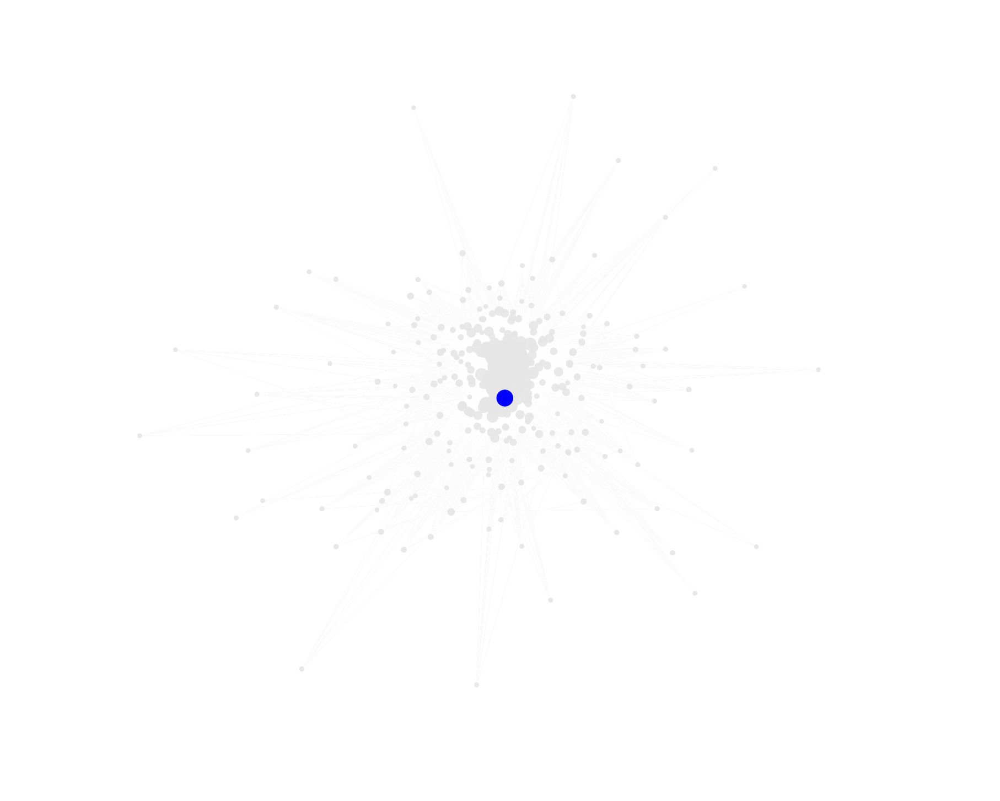

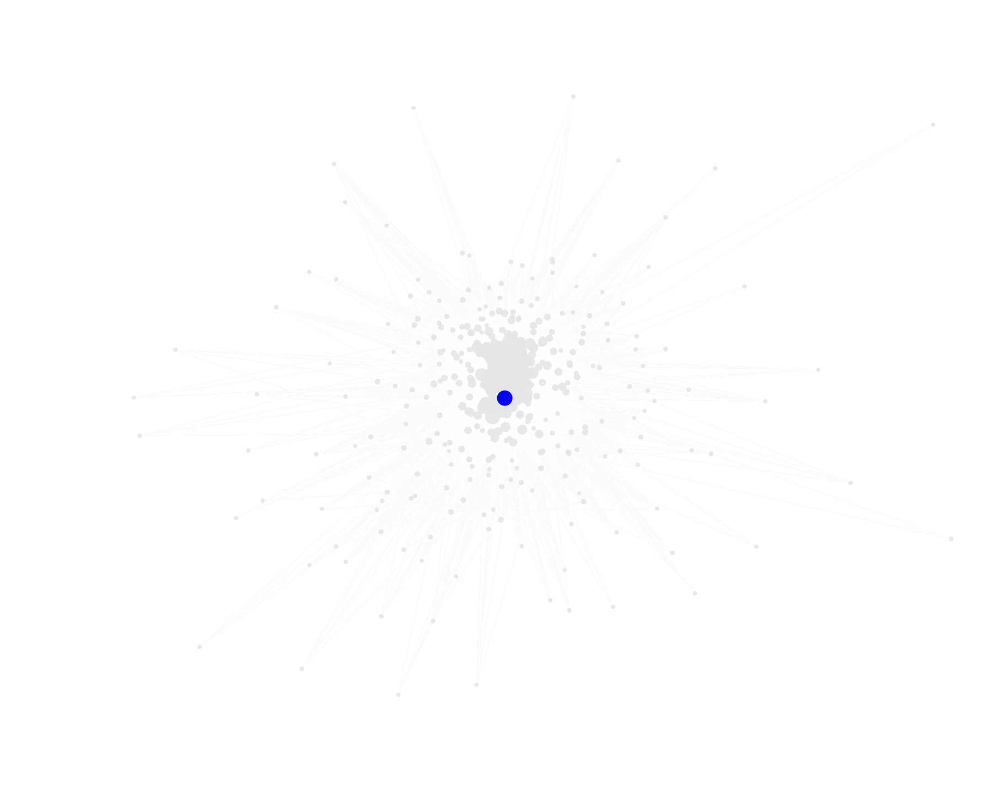

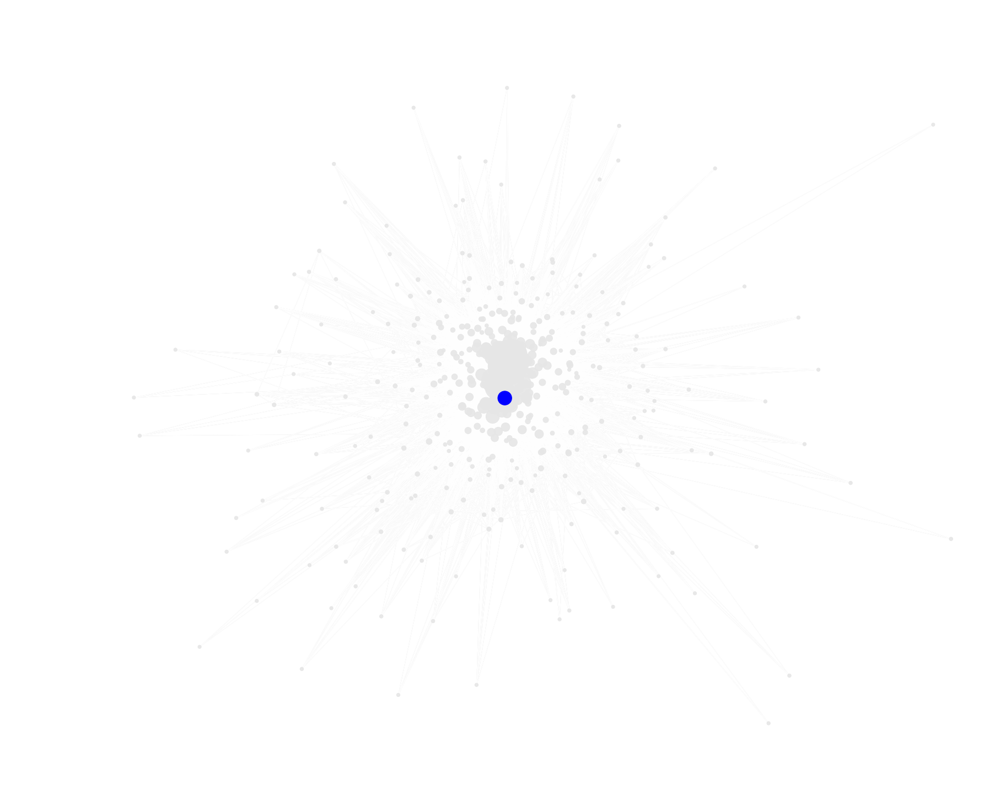

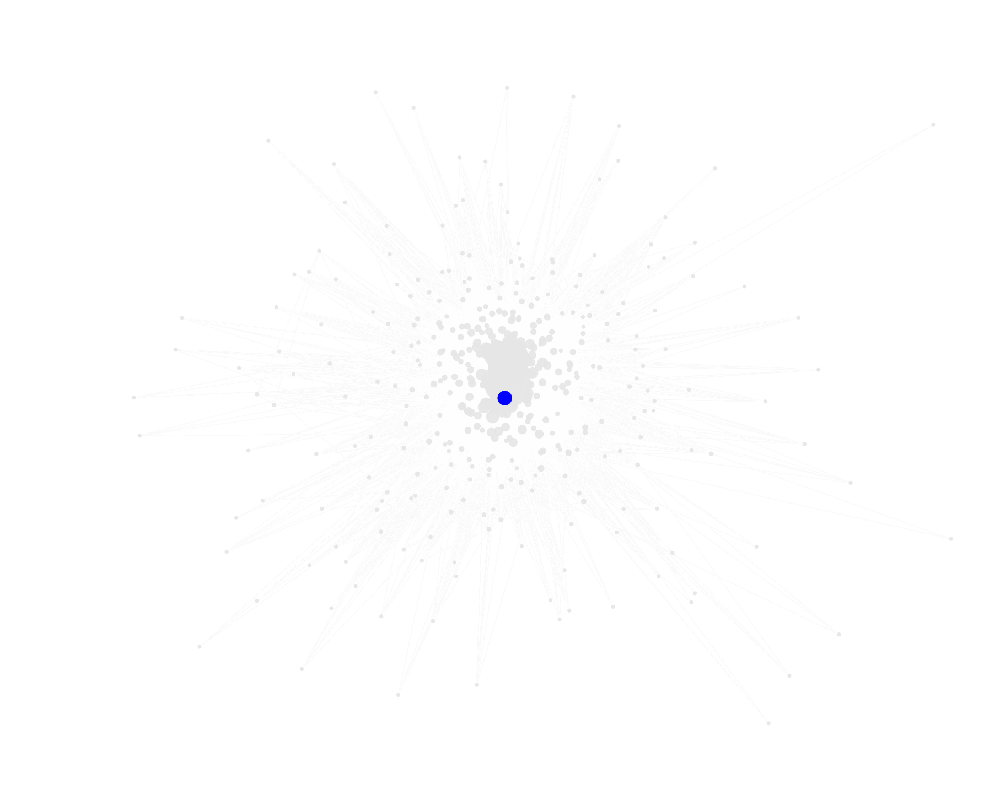

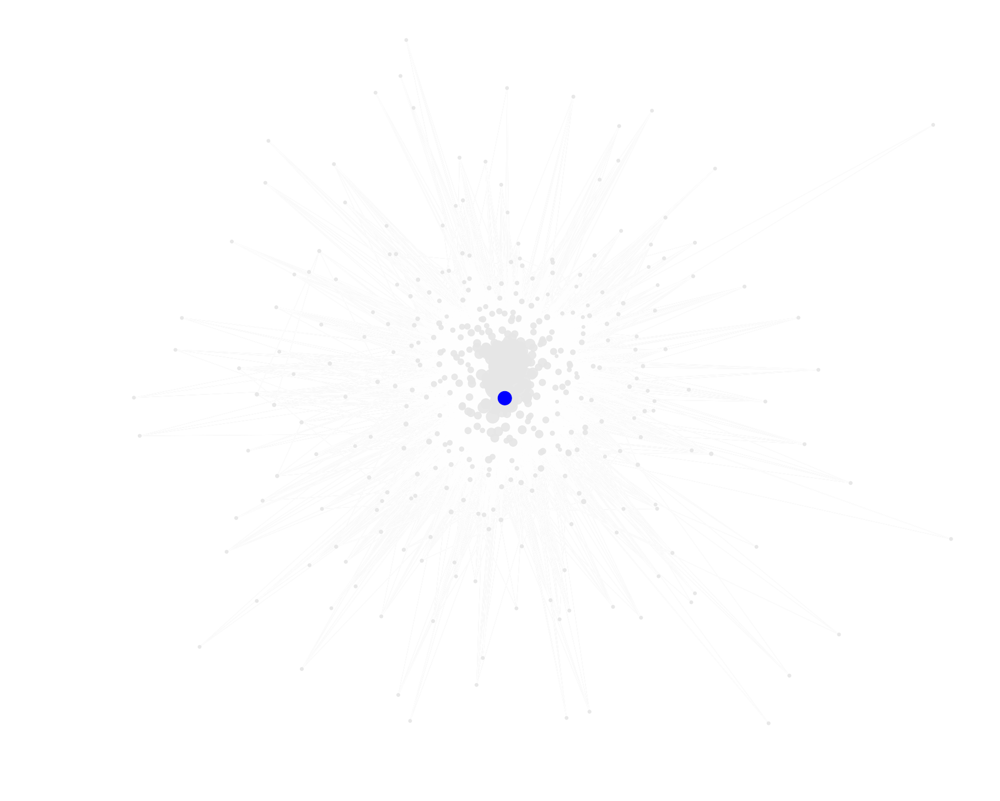

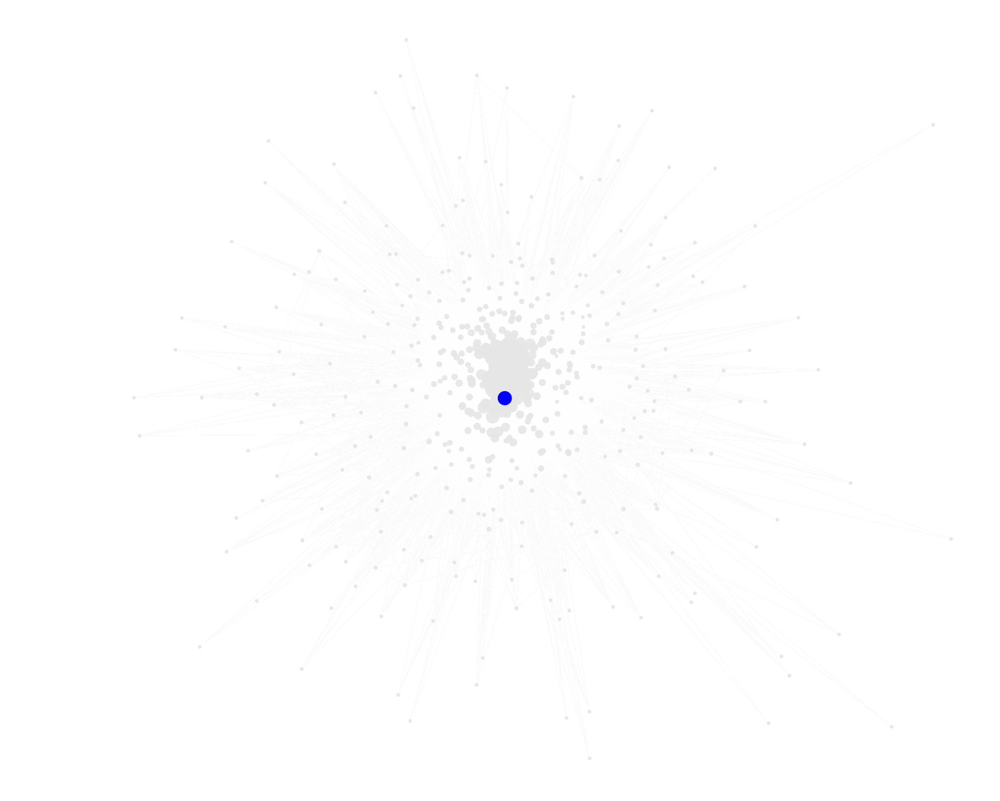

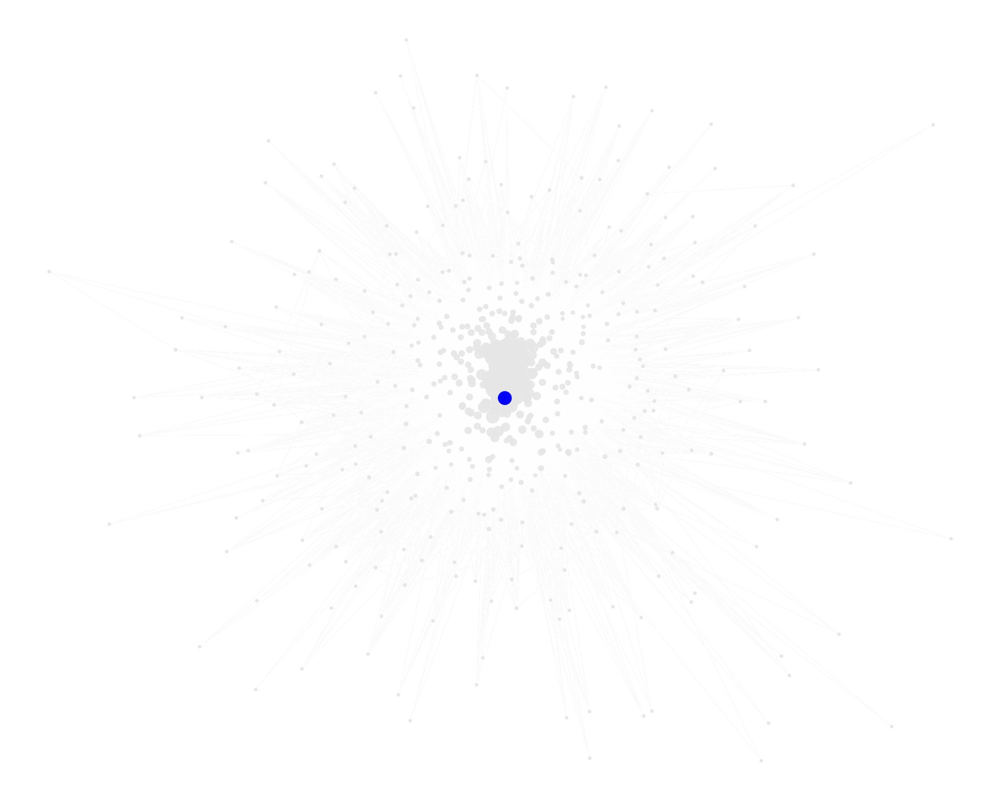

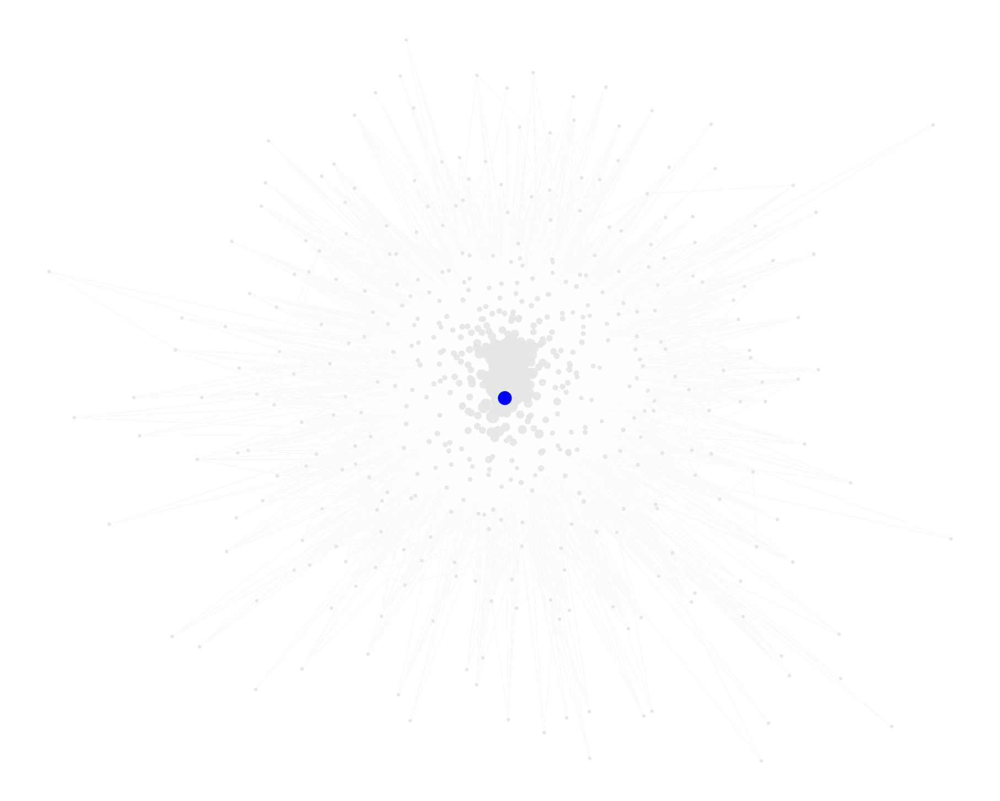

In [72]:
#load NODE data as lists. The symbols such as (' , etc were concatenated on 

for x in range(1982, 2018, 5):
  
  temp_df = carrusel_df.loc[(carrusel_df['year'] <= x)]
  
  nodesrecipes_temp = list(temp_df.recipe_name.unique())
  nodesingredients_temp = list(temp_df.ingredient_en.unique())
  edgesrecipeingredient_temp = list(zip(temp_df.recipe_name, temp_df.ingredient_en))
  
  #create Temporal Bipartite Network
  #here we are creating an empty graph (network)
  B_temp = nx.Graph()

  #we are adding the nodes, which we loaded on the previous step. 
  #note how we add the bipartite nodes below
  B_temp.add_nodes_from(nodesrecipes_temp, bipartite=0)
  B_temp.add_nodes_from(nodesingredients_temp, bipartite=1)
  
  #add edges
  B_temp.add_edges_from(edgesrecipeingredient_temp)
  
  #we want these statistics on the output
  print("Number of Recipes", x,": ", len(nodesrecipes_temp))
  print("Number of Ingredients",": ", x ,len(nodesingredients_temp))

  G_temp = bipartite.weighted_projected_graph(B_temp,nodesingredients_temp)
  #get the node degrees
  pgr_temp = dict(nx.pagerank(G_temp))

  plt.figure(figsize=(25,20))

  #THIS IS IMPORTANT. THE POSITIONS ARE FROM THE AGGREGATED NETWORK AS I DONT WANT THE NODES TO JUMP AROUND
  pos_temp = nx.spring_layout(G)
  
  #coloring white. To retain positions
  nx.draw(G, pos = pos, 
        nodelist=d.keys(), 
        with_labels=False, 
        edge_color = '#FFFFFF', 
        node_color='#FFFFFF',
        node_size=0.0000000000000000000000000000000000000000000000000000000000001)
  
  nx.draw(G_temp, 
          nodelist=pgr_temp.keys(), pos = pos, 
          with_labels=False, 
          edge_color = '#e6e6e6', 
          node_color='#e6e6e6',
          node_size=[v * 100000 for v in pgr_temp.values()],
          alpha=0.9)
  
  nx.draw(G_temp, 
          nodelist=["sugar"], pos = pos, 
          with_labels=False, 
          edge_color = '#FFFFFF', 
          node_color='b',
          node_size=[v * 100000 for v in pgr_temp.values()])

  plt.savefig("tempnetsugarjump.jpg")

  #saving the plot to the local machine
  #files.download("tempnetsugarjump.jpg") 
  
  plt.close("tempnetsugarjump.jpg")

**Sugar Degree month to Month**

Number of Recipes 1 :  252
Number of Ingredients :  1 250
Number of Recipes 2 :  704
Number of Ingredients :  2 348
Number of Recipes 3 :  1134
Number of Ingredients :  3 379
Number of Recipes 4 :  1620
Number of Ingredients :  4 408
Number of Recipes 5 :  2172
Number of Ingredients :  5 439
Number of Recipes 6 :  2694
Number of Ingredients :  6 465
Number of Recipes 7 :  3205
Number of Ingredients :  7 483
Number of Recipes 8 :  3696
Number of Ingredients :  8 492
Number of Recipes 9 :  4229
Number of Ingredients :  9 512
Number of Recipes 10 :  4754
Number of Ingredients :  10 527
Number of Recipes 11 :  5264
Number of Ingredients :  11 537
Number of Recipes 12 :  5981
Number of Ingredients :  12 559


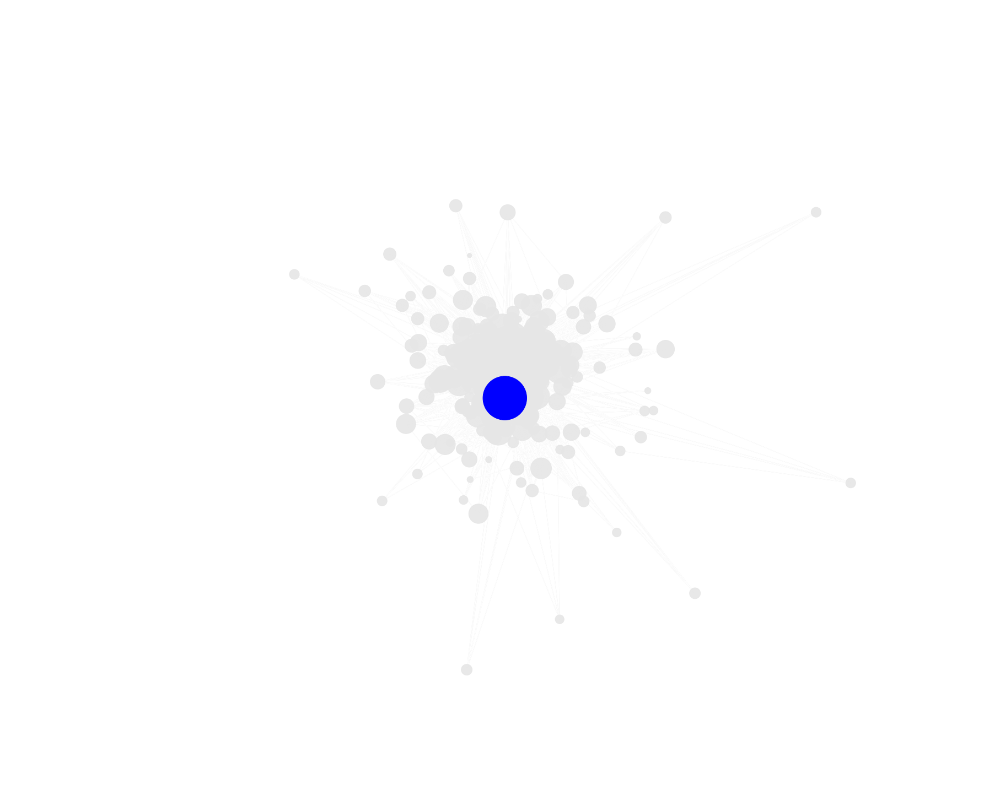

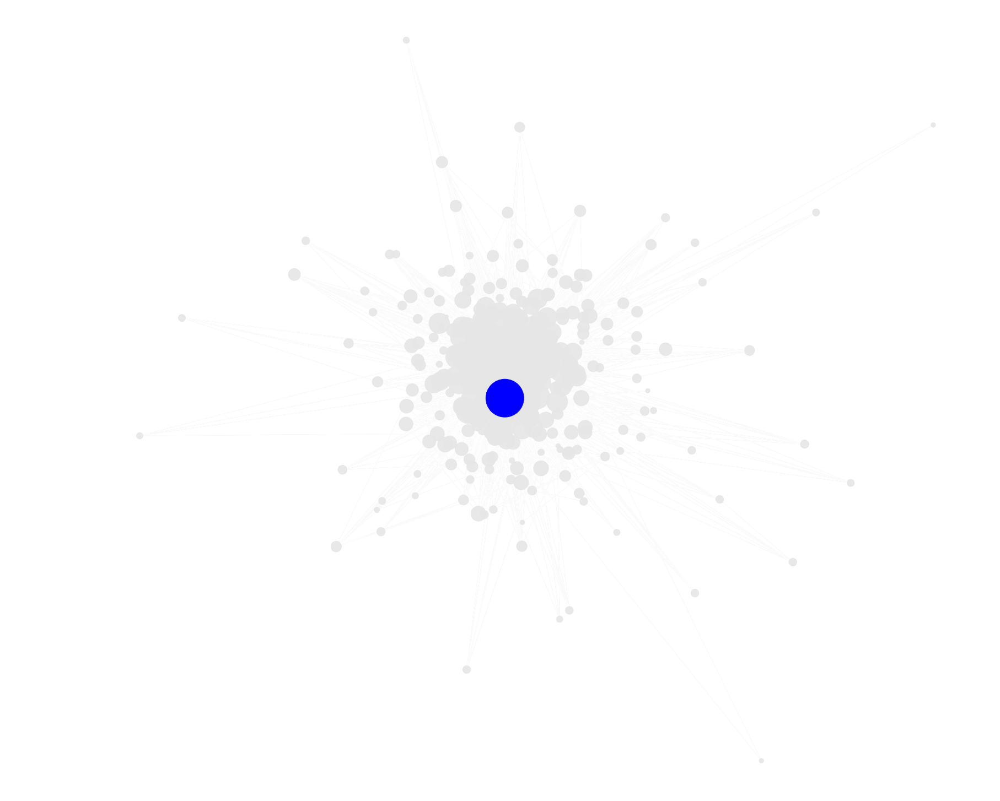

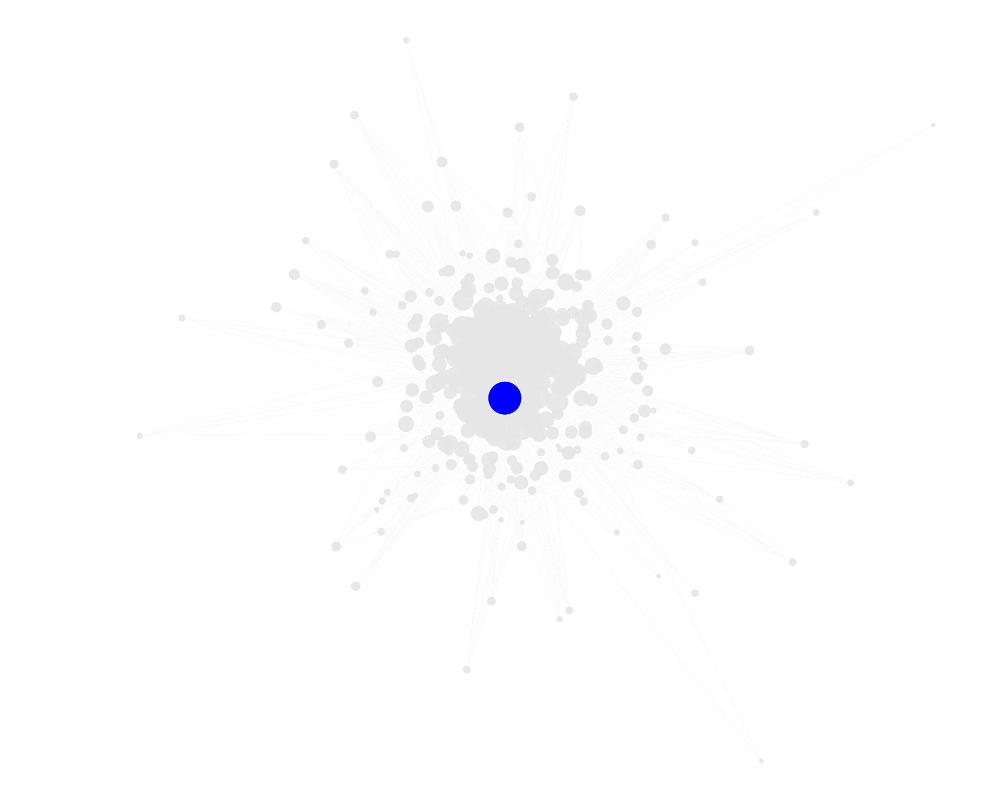

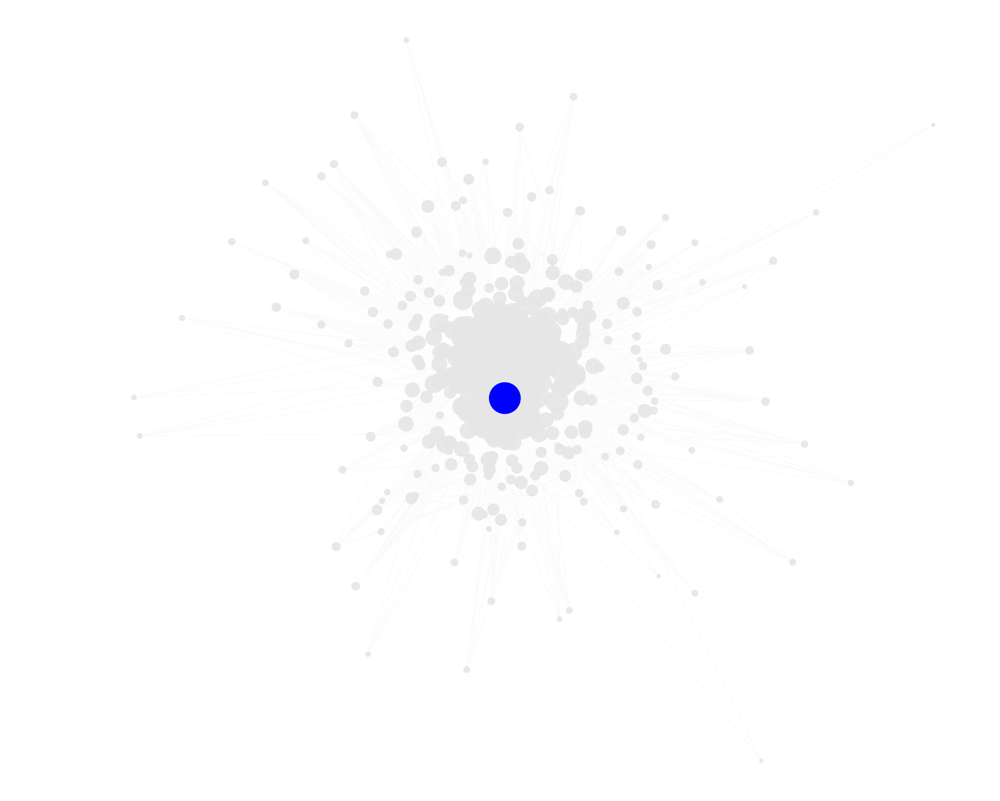

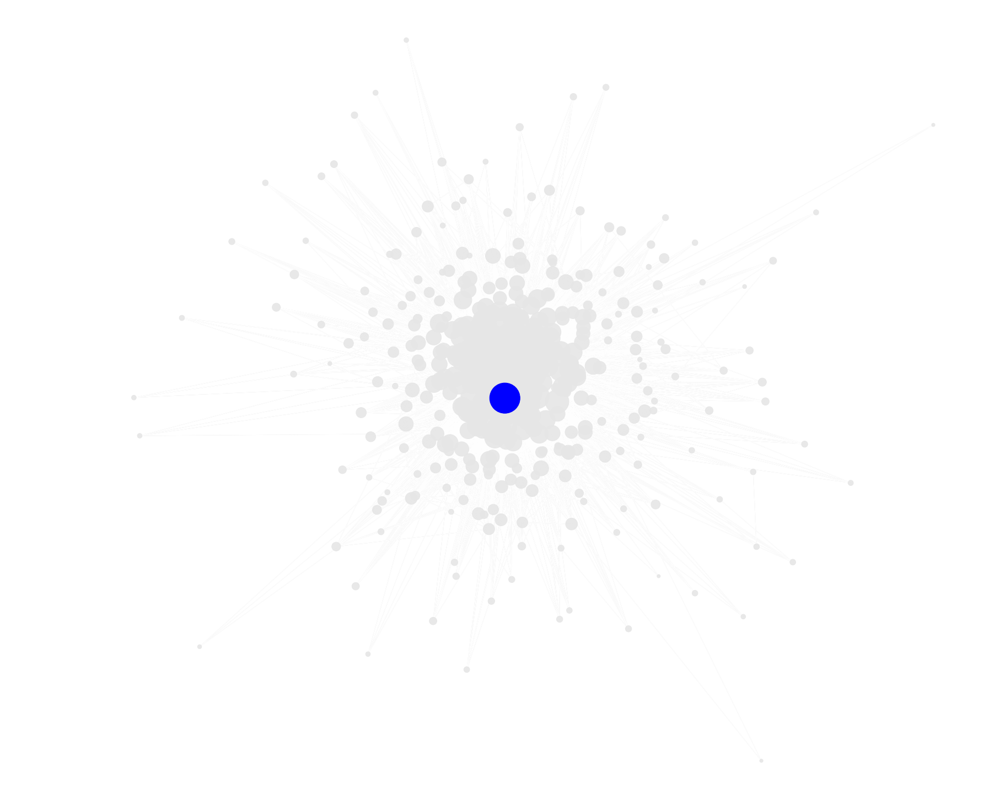

...

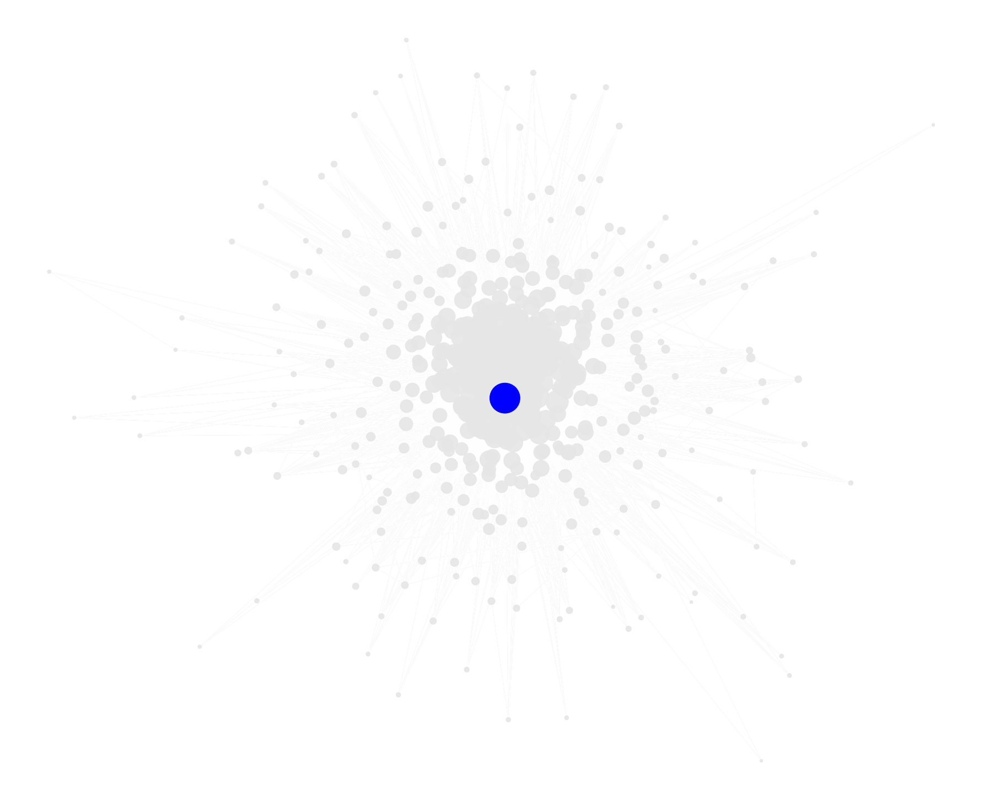

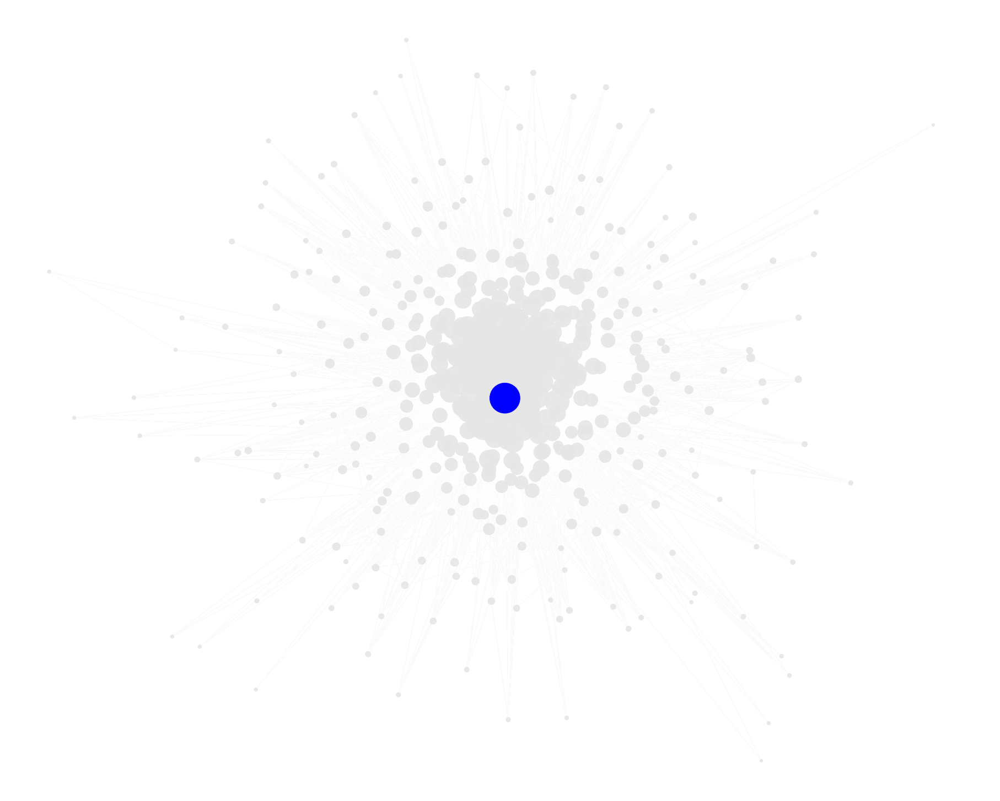

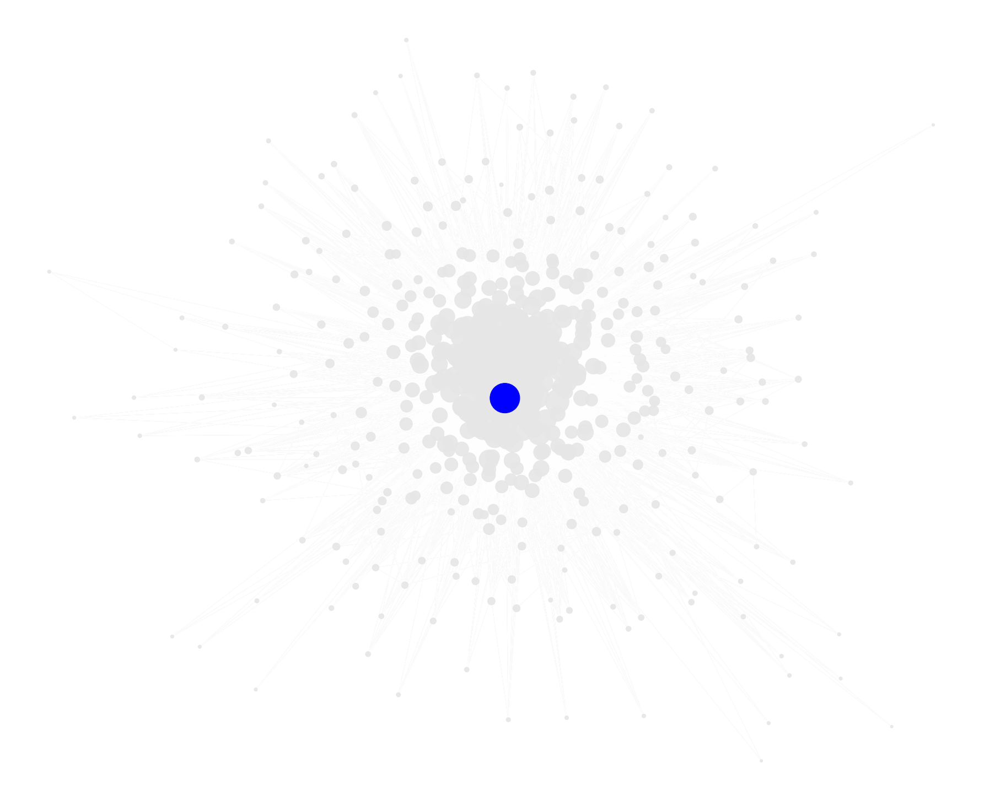

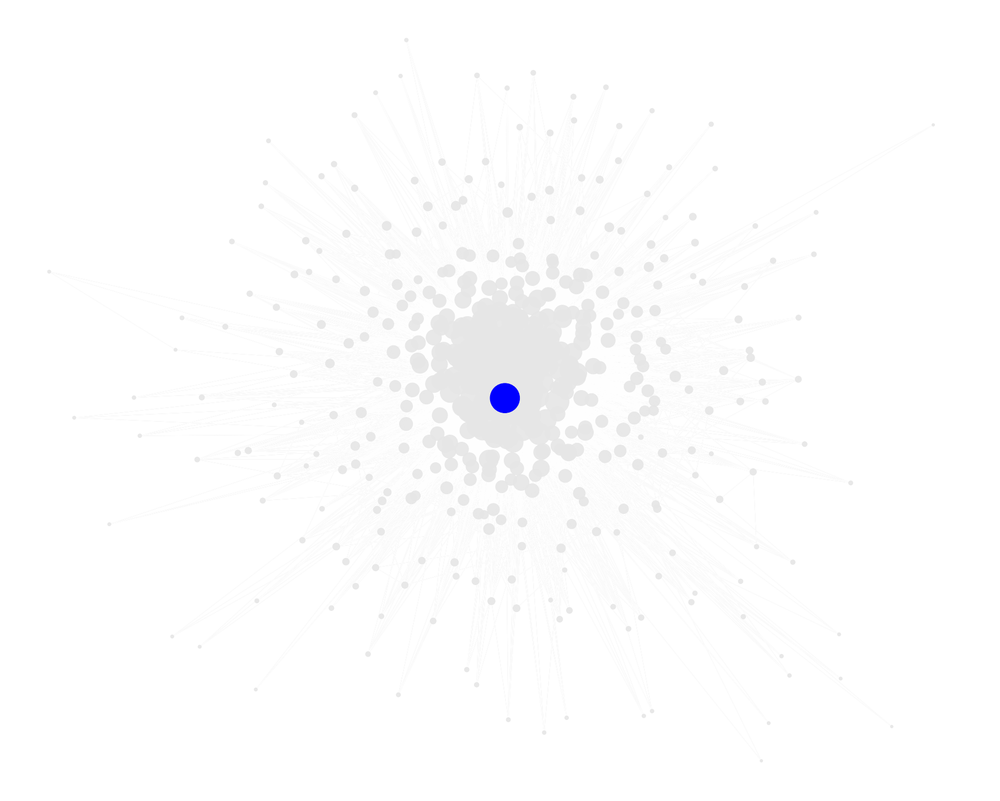

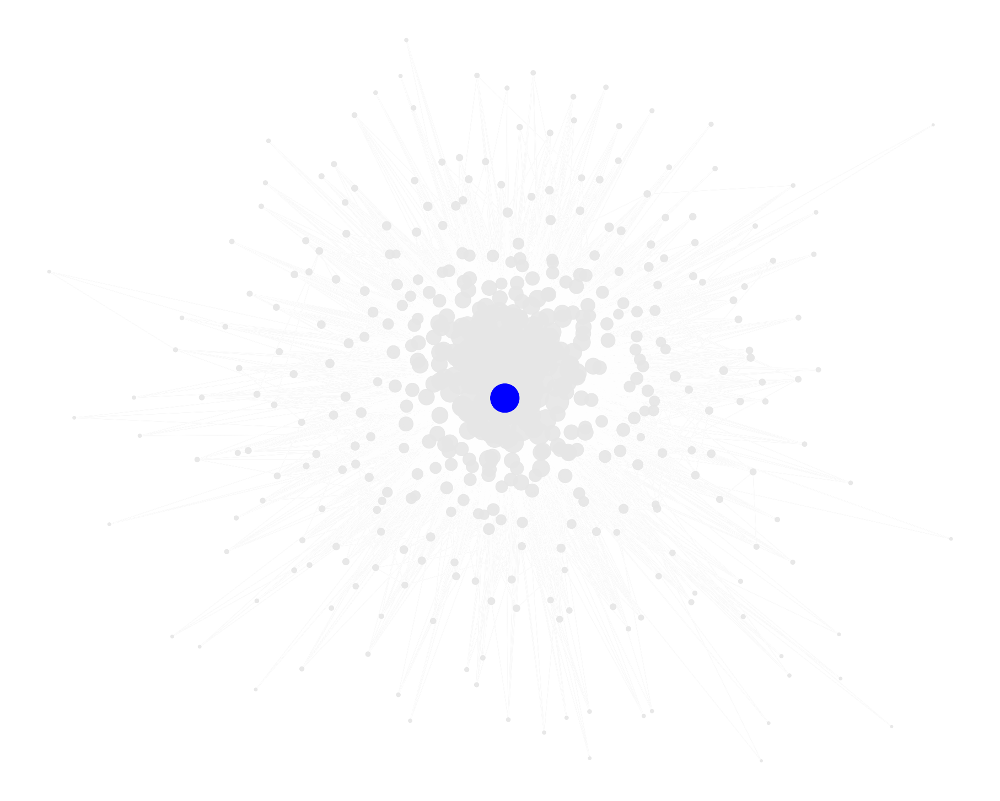

In [73]:
#number of months
for x in range(1, 13):
  
  #load information based on month
  temp_df = carrusel_df.loc[(carrusel_df['month'] <= x)]
  
  #load nodes, nodes, edges
  nodesrecipes_temp = list(temp_df.recipe_name.unique())
  nodesingredients_temp = list(temp_df.ingredient_en.unique())
  edgesrecipeingredient_temp = list(zip(temp_df.recipe_name, temp_df.ingredient_en))
  
  
  #create Temporal Bipartite Network
  #here we are creating an empty graph (network)
  B_temp = nx.Graph()

  #we are adding the nodes, which we loaded on the previous step. 
  #note how we add the bipartite nodes below
  B_temp.add_nodes_from(nodesrecipes_temp, bipartite=0)
  B_temp.add_nodes_from(nodesingredients_temp, bipartite=1)
  
  #add edges
  B_temp.add_edges_from(edgesrecipeingredient_temp)
  
  #we want these statistics on the output
  print("Number of Recipes", x,": ", len(nodesrecipes_temp))
  print("Number of Ingredients",": ", x ,len(nodesingredients_temp))
  

  #projecting the graph (there are many ways to do this. Using weighted here)
  G_temp = bipartite.weighted_projected_graph(B_temp,nodesingredients_temp)
  #get the node degrees
  d_temp = dict(G_temp.degree)
  
  #now we will normalize them. 
  ##We define normalization for dictionaries
  def normalize(d, target=1.0):
    raw = sum(d.values())
    factor = target/raw
    return {key:value*factor for key,value in d.items()}
  #use the function to normalize
  d_temp = normalize(d_temp)
  
  
  
  plt.figure(figsize=(25,20))

  #THIS IS IMPORTANT. THE POSITIONS ARE FROM THE AGGREGATED NETWORK AS I DONT WANT THE NODES TO JUMP AROUND
  #pos = nx.kamada_kawai_layout(G)
  pos_temp = pos
  
  #coloring white. To retain positions
  nx.draw(G, pos = pos, 
        nodelist=d.keys(), 
        with_labels=False, 
        edge_color = '#FFFFFF', 
        node_color='#FFFFFF',
        node_size=0.0000000000000000000000000000000000000000000000000000000000001)
  
  nx.draw(G_temp, 
          nodelist=d_temp.keys(), pos = pos, 
          with_labels=False, 
          edge_color = '#e6e6e6', 
          node_color='#e6e6e6',
          node_size=[v * 500000 for v in d_temp.values()],
          alpha=0.9)
  
  nx.draw(G_temp, 
          nodelist=["sugar"], pos = pos, 
          with_labels=False, 
          edge_color = '#FFFFFF', 
          node_color='b',
          node_size=[v * 500000 for v in d_temp.values()])

  plt.savefig("tempnetsugar.jpg")

  #saving the plot to the local machine
  #files.download("tempnetsugar.jpg") 
  
  plt.close("tempnetsugar.jpg")

In [74]:
from forceatlas import forceatlas2_layout 
#from writeNodesEdges import writeObjects 
#import sys
#generation = int(sys.argv[1])
#H = nx . dorogovtsev_goltsev_mendes_graph ( generation )
# Force Atlas 2 from https://github.com/tpoisot/nxfa2.git
pos = forceatlas2_layout(G, iterations=10, kr=0.001, dim=2)


ModuleNotFoundError: No module named 'forceatlas'

In [ ]:
nx.generate_gexf(G,'PageRanks2.csv')
print("c")
files.download('PageRanks2.csv')

# Analysis

In [ ]:
for x in range(1977, 2018):
  temp_df = carrusel_df.loc[(carrusel_df['year'] == x)]
  
  nodesrecipes_temp = list(temp_df.recipe_name.unique())
  nodesingredients_temp = list(temp_df.ingredient_en.unique())
  edgesrecipeingredient_temp = list(zip(temp_df.recipe_name, temp_df.ingredient_en))
  
  
  #create Temporal Bipartite Network
  #here we are creating an empty graph (network)
  B_temp = nx.Graph()

  #we are adding the nodes, which we loaded on the previous step. 
  #note how we add the bipartite nodes below
  B_temp.add_nodes_from(nodesrecipes_temp, bipartite=0)
  B_temp.add_nodes_from(nodesingredients_temp, bipartite=1)
  
  #add edges
  B_temp.add_edges_from(edgesrecipeingredient_temp)
  
  #we want these statistics on the output
  print("Number of Recipes", x,": ", len(nodesrecipes_temp))
  print("Number of Ingredients",": ", x ,len(nodesingredients_temp))
  

  G_temp = bipartite.weighted_projected_graph(B_temp,nodesingredients_temp)
  #get the node degrees
  pgr_temp = nx.pagerank(G_temp)
  
#get first year
  if x == 1977:
      df_pagerank = pd.DataFrame.from_dict(pgr_temp, orient='index', columns=[x])
#get years after first year
  elif x > 1977:
      df_pagerank_temp = pd.DataFrame.from_dict(pgr_temp, orient='index', columns=[x])
#merge
      df_pagerank = pd.merge(df_pagerank, df_pagerank_temp, left_index=True, right_index=True, how = 'outer')


In [ ]:
df_pagerank.to_csv("/Users/juan/Dropbox/ACADEMICO/NYU PHD/Dissertation/paper3carrusel/pagerank_yty.csv")

In [ ]:
#?pd.DataFrame.to_csv